# Сборный проект 2: HR аналитика

# Модель машинного обучения для HR-аналитиков компании «Работа с заботой».

Компания предоставила данные с характеристиками сотрудников компании. Среди них — уровень удовлетворённости сотрудника работой в компании. Эту информацию получили из форм обратной связи: сотрудники заполняют тест-опросник, и по его результатам рассчитывается доля их удовлетворённости от 0 до 1, где 0 — совершенно неудовлетворён, 1 — полностью удовлетворён. Почему бизнесу это важно: удовлетворённость работой напрямую влияет на отток сотрудников. А предсказание оттока — одна из важнейших задач HR-аналитиков. Внезапные увольнения несут в себе риски для компании, особенно если уходит важный сотрудник.


**Цель исследования:**
1. Построить модель, которая сможет предсказать уровень удовлетворённости сотрудника на основе данных заказчика;
2. Построить модель, которая сможет на основе данных заказчика предсказать то, что сотрудник уволится из компании.



**Ход исследования**

Данные получим из файлов для первой модели -  `Тренировочная выборка: train_job_satisfaction_rate.csv, входные признаки тестовой выборки: test_features.csv, целевой признак тестовой выборки: test_target_job_satisfaction_rate.csv`, 

для второй модели - `Тренировочная выборка: train_quit.csv, входные признаки тестовой выборки: test_features.csv, целевой признак тестовой выборки: test_target_quit.csv`,

просмотрим общую информацию о датасете, оценим качество данных.

Далее приступим к предобработке данных: проверим и исправим ошибки, которые не приведут к искажению конечного результата, оценим их влияние на исследование. 

Затем настанет очередь исследовательского и корреляционного анализа данных.

После этого применим пайплайны для подготовки признаков и подбора лучшей модели.

Завершающим этапом исследования будет анализ важности признаков и сегментация покупателей.

Таким образом, иследование для [задачи №1](#task1) и [задачи №2](#task2) будет состоять из следующих этапов:

- Обзор данных [1](#info1) и [2](#info2)

- Предобработка данных [1](#preprocessing1) и [2](#preprocessing2)

- Исследовательский анализ данных [1](#EDA1) и [2](#EDA2)

- Подготовка данных [1](#pipeline1) и [2](#pipeline2)

- Обучение моделей [1](#model1) и [2](#model2)

- [Итоговые выводы](#final)

## Описание данных

Для решения задачи заказчик предоставил данные с признаками:

| | |
| ------ | ------ | 
| **id** | уникальный идентификатор сотрудника| 
| **dept** | отдел, в котором работает сотрудник |
| **level** | уровень занимаемой должности |
| **workload** | уровень загруженности сотрудника |
| **employment_years** | длительность работы в компании (в годах) |
|**last_year_promo**|показывает, было ли повышение за последний год|
|**last_year_violations**|показывает, нарушал ли сотрудник трудовой договор за последний год|
|**supervisor_evaluation**|оценка качества работы сотрудника, которую дал руководитель|
|**salary**|ежемесячная зарплата сотрудника|
|**job_satisfaction_rate**|уровень удовлетворённости сотрудника работой в компании, целевой признак для 1 задачи|
|**quit**| увольнение сотрудника из компании, целевой признак для 2 задачи|


## **Задача 1: предсказание уровня удовлетворённости сотрудника**
<a id='task1'></a>

### **Общая информация**
<a id='info1'></a>

In [1]:
# Импротируем необходимые библиотеки
import pandas as pd
import numpy as np
import scipy.stats as st
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

!pip install -Uq scikit-learn
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyRegressor, DummyClassifier
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler, 
    MinMaxScaler,
    RobustScaler,
    LabelEncoder
)
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, make_scorer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest 
from sklearn.feature_selection import f_classif, mutual_info_classif 
# Зафиксируем случайность  и размер тестовой выборки
RANDOM_STATE = 42
TEST_SIZE = 0.25

!pip install phik -q
import phik

!pip install shap -q
import shap


sklearn.__version__

'1.7.2'

In [3]:
# Загружаем файлы
train_rate = pd.read_csv('train_job_satisfaction_rate.csv')
test_features = pd.read_csv('test_features.csv')
target_satisfaction = pd.read_csv('test_target_job_satisfaction_rate.csv')

In [ ]:
# Создаем функцию для получения общей информации
def general_info(df):
    return df.info(), display(df.shape, df.head())

In [ ]:
# Посмотрим на первые 5 строк каждого датасета и общую информацию
general_info(train_rate)
general_info(test_features)
general_info(target_satisfaction)

**`train_job_satisfaction_rate.csv`** содержит **4000 строк и 10 столбцов**.

**`test_features.csv`** содержит **2000 строк и 9 столбцов**.

**`test_target_job_satisfaction_rate.csv`** содержит **2000 строк и 2 столбца**.

В данных присутствуют пропуски (заполним их в пайплайне), типы данных корректны.

### **Предобработка данных**
<a id='preprocessing1'></a>

#### **Явные и неявные дубликаты**

Проверим количество **неявных** дубликатов в данных.

In [ ]:
# Напишем функцию для уникальных значений категориальных столбцов
def cat_unique(df):
    columns = df.select_dtypes(exclude='number').columns.to_list()
    for col in columns:
         display(col, df[col].unique())

In [ ]:
# Выведем уникальные значения категориальных столбцов 
cat_unique(train_rate)
cat_unique(test_features)
cat_unique(target_satisfaction)

Неявные дубликаты не обнаружены. Помимо пропущенных значений, в категориальных признаках присутствует значение ' '. Заменим его на пропущенное NaN и исправим грамматическую ошибку.

In [ ]:
test_features['dept'] = test_features['dept'].replace(' ', np.nan)
test_features['workload'] = test_features['workload'].replace(' ', np.nan)
train_rate['level'] = train_rate['level'].replace('sinior', 'senior')
test_features['level'] = test_features['level'].replace('sinior', 'senior')


Проверим количество **явных** дубликатов в тренировочных данных.

In [ ]:
train_rate.duplicated().sum()

**Явные** дубликаты также не обнаружены.

**Вывод:** таким образом, мы провели предобработку данных и проверили наличие явных и неявных дубликатов в данных.

### **Исследовательский анализ данных**
<a id='EDA1'></a>

#### **Статистический анализ количественных признаков**

In [4]:
# Выведем статистики количественных признаков
display(train_rate.drop('id', axis=1).describe(), test_features.drop('id', axis=1).describe())

,employment_years,supervisor_evaluation,salary,job_satisfaction_rate
count,4000.000000,4000.000000,4000.000000,4000.000000
mean,3.718500,3.476500,33926.700000,0.533995
std,2.542513,1.008812,14900.703838,0.225327
min,1.000000,1.000000,12000.000000,0.030000
25%,2.000000,3.000000,22800.000000,0.360000
50%,3.000000,4.000000,30000.000000,0.560000
75%,6.000000,4.000000,43200.000000,0.710000
max,10.000000,5.000000,98400.000000,1.000000


,employment_years,supervisor_evaluation,salary
count,2000.000000,2000.000000,2000.000000
mean,3.666500,3.526500,34066.800000
std,2.537222,0.996892,15398.436729
min,1.000000,1.000000,12000.000000
25%,1.000000,3.000000,22800.000000
50%,3.000000,4.000000,30000.000000
75%,6.000000,4.000000,43200.000000
max,10.000000,5.000000,96000.000000


Во всех признаках минимальные и максимальные значения соответствуют реальности, среднее несильно отличается от медианы. Тренировочная выборка не имеет значительных различий с тестовой.

Построим графики для количественных признаков: гистограмму частотности распределения и ящик с усами.

In [5]:
# Определим функцию для построения гистрограммы
def hist_plot(df):
    for col in df.select_dtypes(include='number').columns:
        plt.figure(figsize=(16,7))
        df[col].hist(bins=50)
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

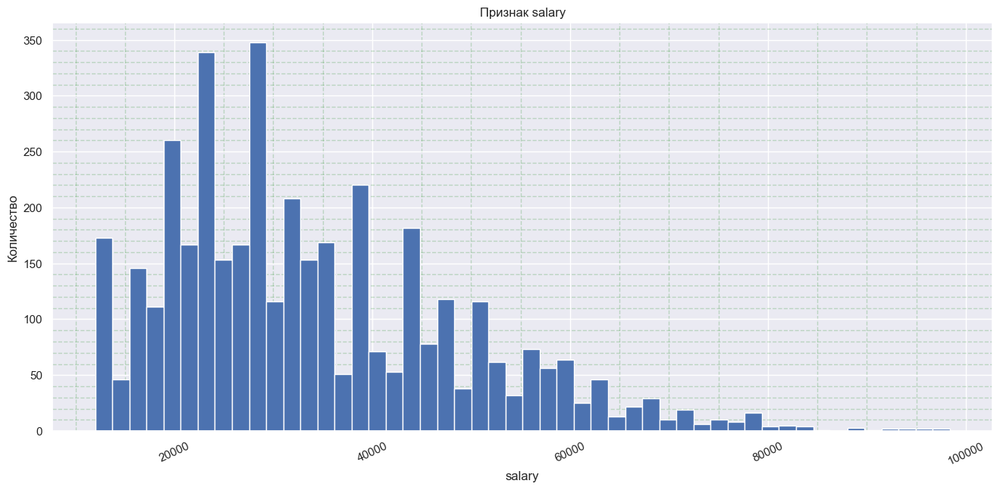

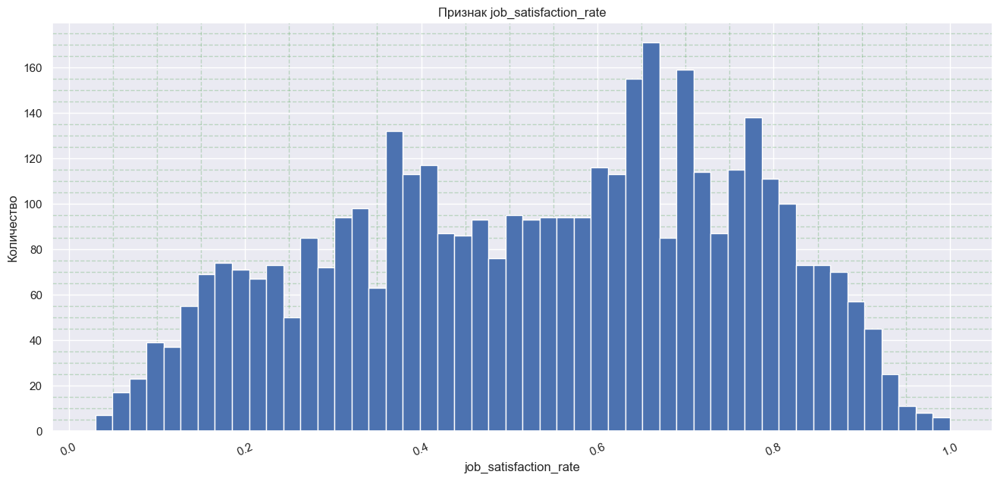

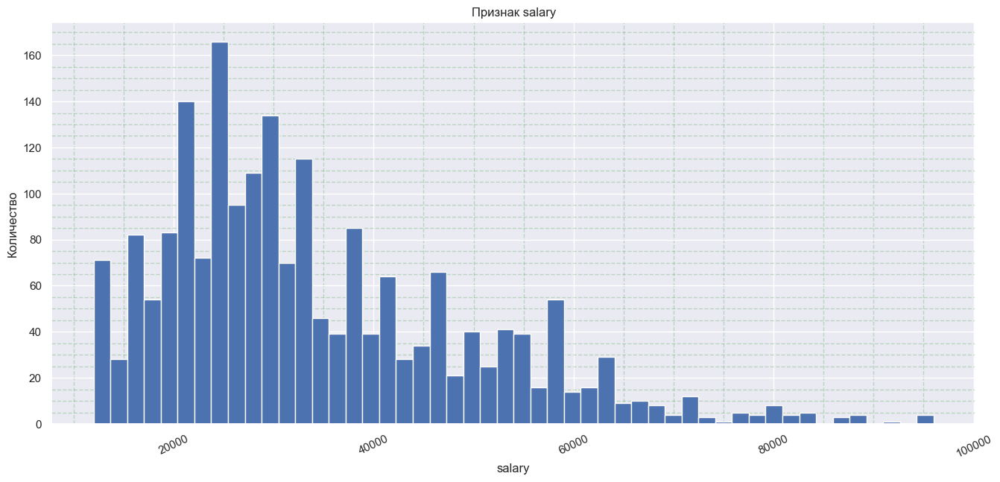

In [6]:
# Строим гистограмму
hist_plot(train_rate.drop(['id','employment_years','supervisor_evaluation'], axis=1))
hist_plot(test_features.drop(['id','employment_years','supervisor_evaluation'], axis=1))

Признаки не имеют сильных выбросов и аномалий,  

`salary, job_satisfaction_rate` - непрерывные, мы имеем дело с задачей регрессии.

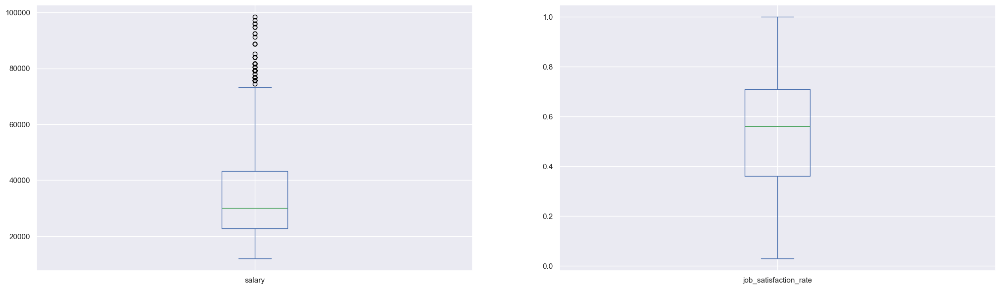

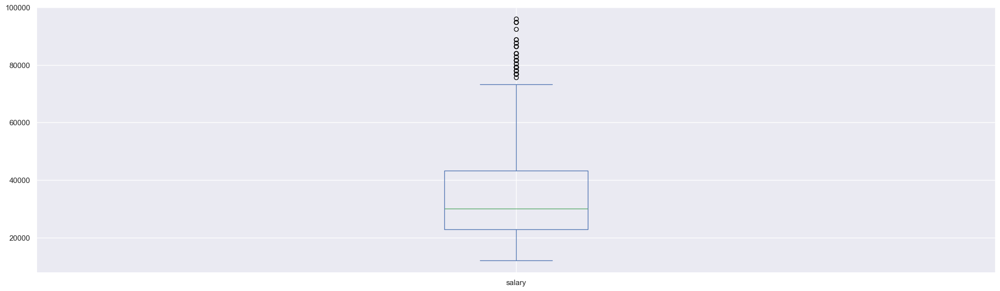

In [7]:
# Строим ящик с усами
train_rate.drop(['id','employment_years','supervisor_evaluation'], axis=1).plot(
    kind='box', 
    subplots=True, 
    sharey=False, 
    figsize=(25, 7)
)
test_features.drop(['id','employment_years','supervisor_evaluation'], axis=1).plot(
    kind='box', 
    subplots=True, 
    sharey=False, 
    figsize=(25, 7)
);

Признак `salary` имеет много выбросов сверху, это может быть связано со спецификой параметра и человеческим фактором.

Построим распределение дискретных признаков `employment_years и supervisor_evaluation`.

In [8]:
def disc_plot(df):
    for col in df[['employment_years', 'supervisor_evaluation']].columns:
        plt.figure(figsize=(16,7))
        sns.countplot(x=col, data=df, palette='viridis')
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


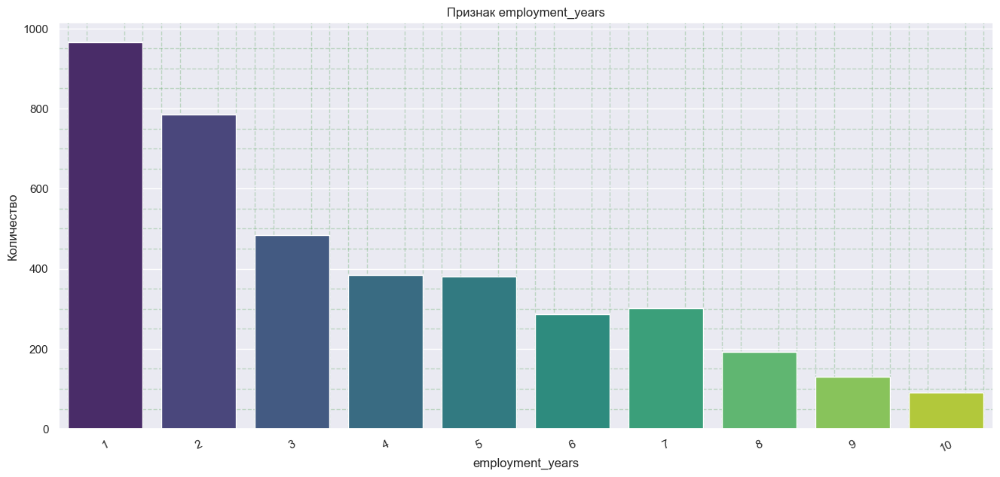

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


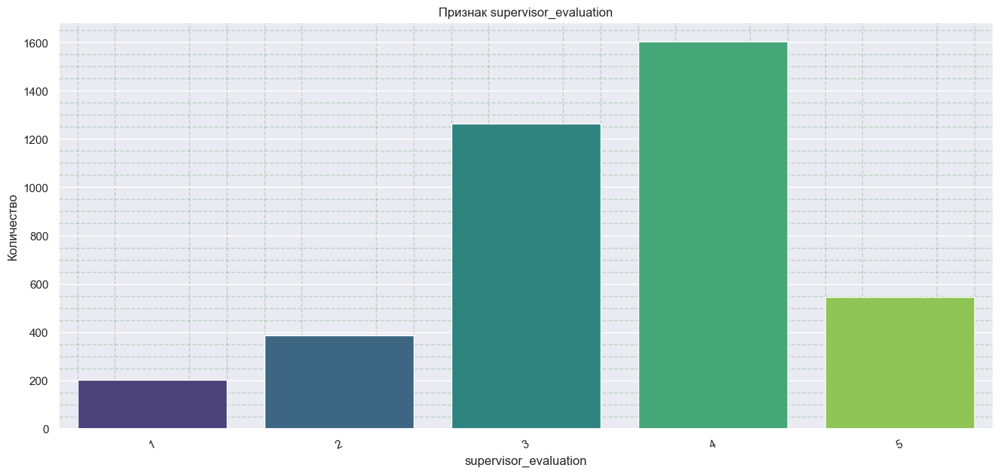

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


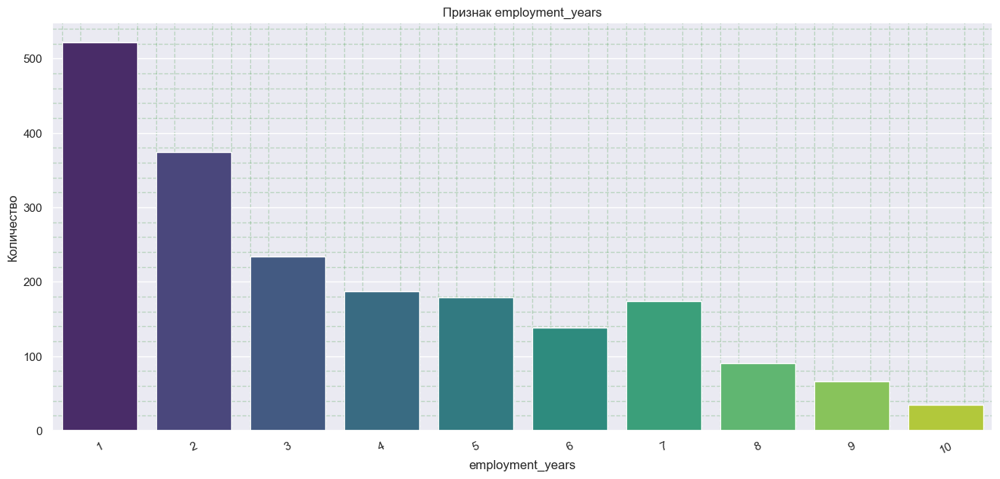

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


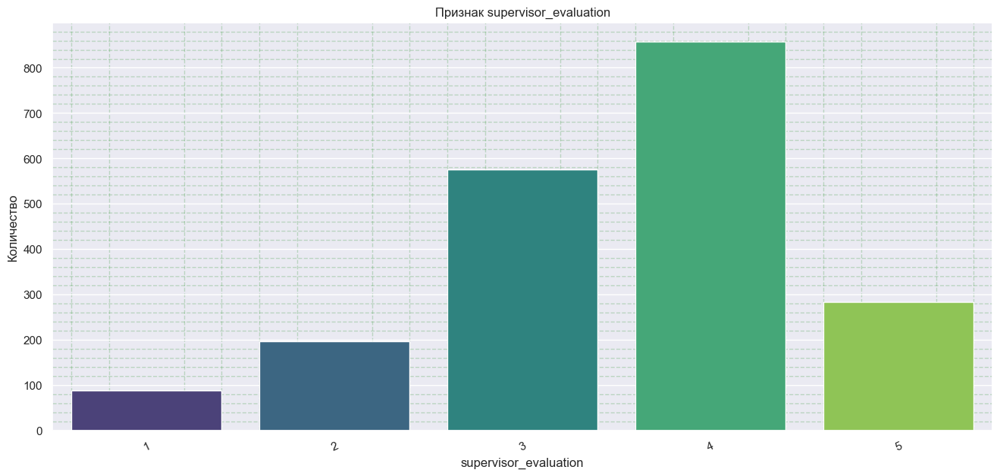

In [9]:
disc_plot(train_rate)
disc_plot(test_features)

Тестовые и тренировочные признаки распределены одинаково, в компании преимущественно находятся сотрудники с длительностью работы 1 год.

#### **Статистический анализ категориальных признаков**

In [10]:
# Создаем функцию, которая строит столбчатую диаграмму для каждого категориального столбца 
def cat_plot(df):
    for col in df.select_dtypes(include=['object']).columns:
        plt.figure(figsize=(16,7))
        sns.countplot(x=col, data=df, palette='viridis')
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


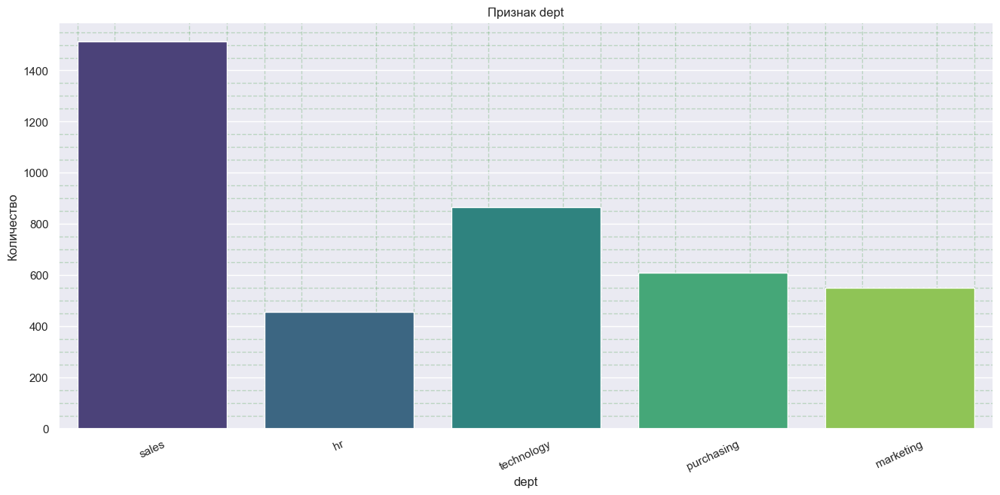

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


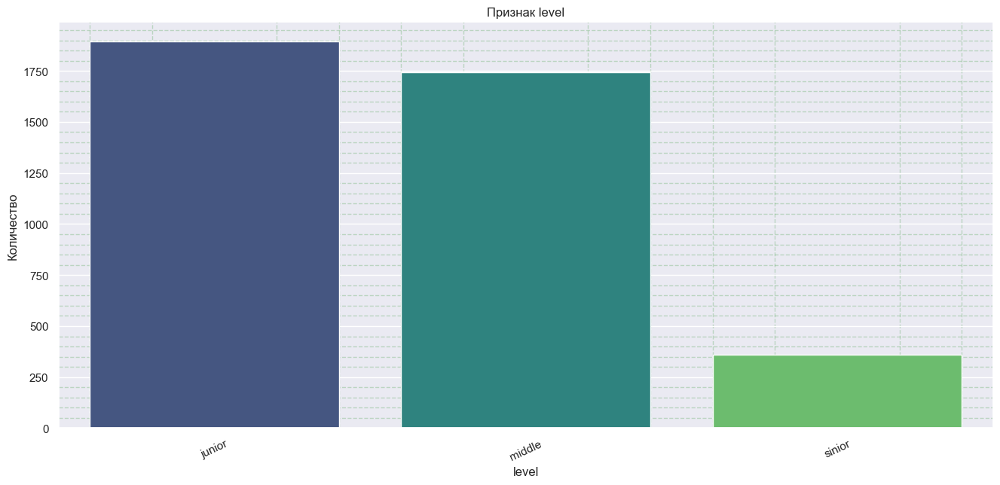

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


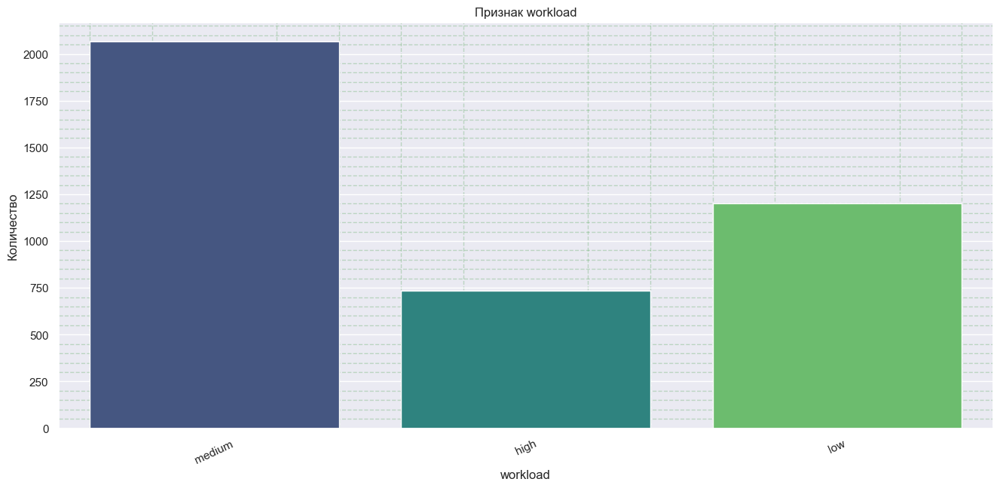

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


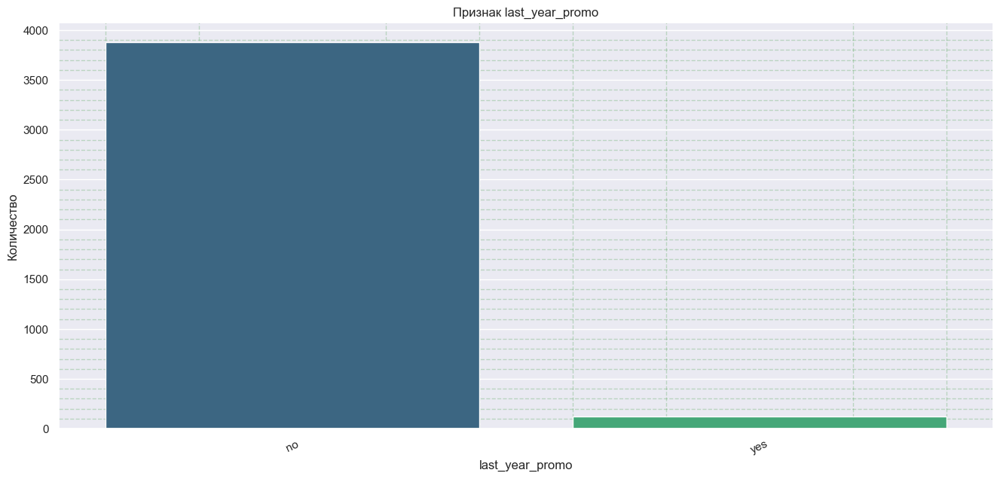

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


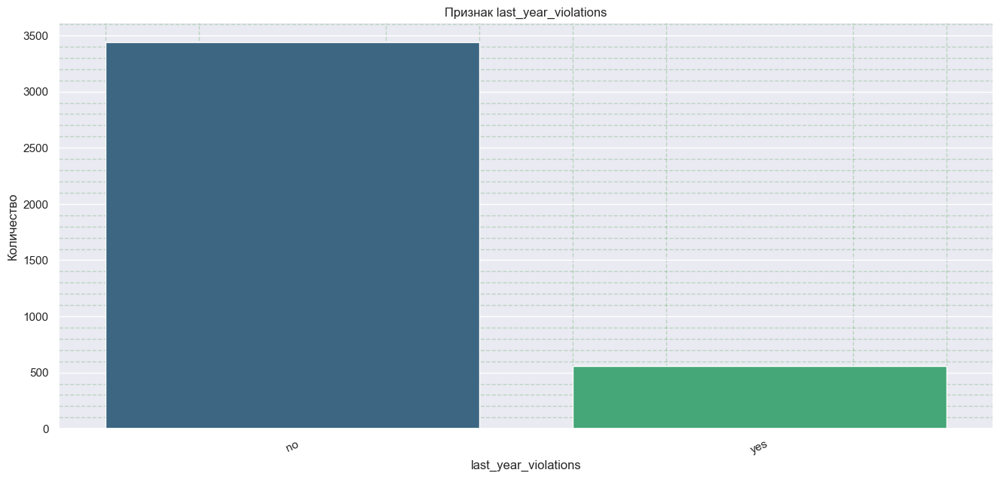

In [11]:
# Строим графики
cat_plot(train_rate)

Мы видим, что

- больше всего работает людей в отделе sales;

- в компании преобладает число сотрудников с уровнем junior;

- загруженность чаще всего средняя;

- повышение за последний год не было у большинства;

- сотрудники трудовой договор за последний год в основном не нарушали.

#### **Корреляционный анализ признаков**

Изучим взаимосвязь между признаками: рассчитаем коэффициенты корреляции между всеми признаками и построим тепловую карту.

In [12]:
# Вычисление матрицы корреляции 
correlation_train= train_rate.drop('id', axis=1).phik_matrix(interval_cols=['salary', 'job_satisfaction_rate'])
correlation_test = test_features.merge(target_satisfaction,on='id').drop('id', axis=1).phik_matrix(interval_cols=['salary'])

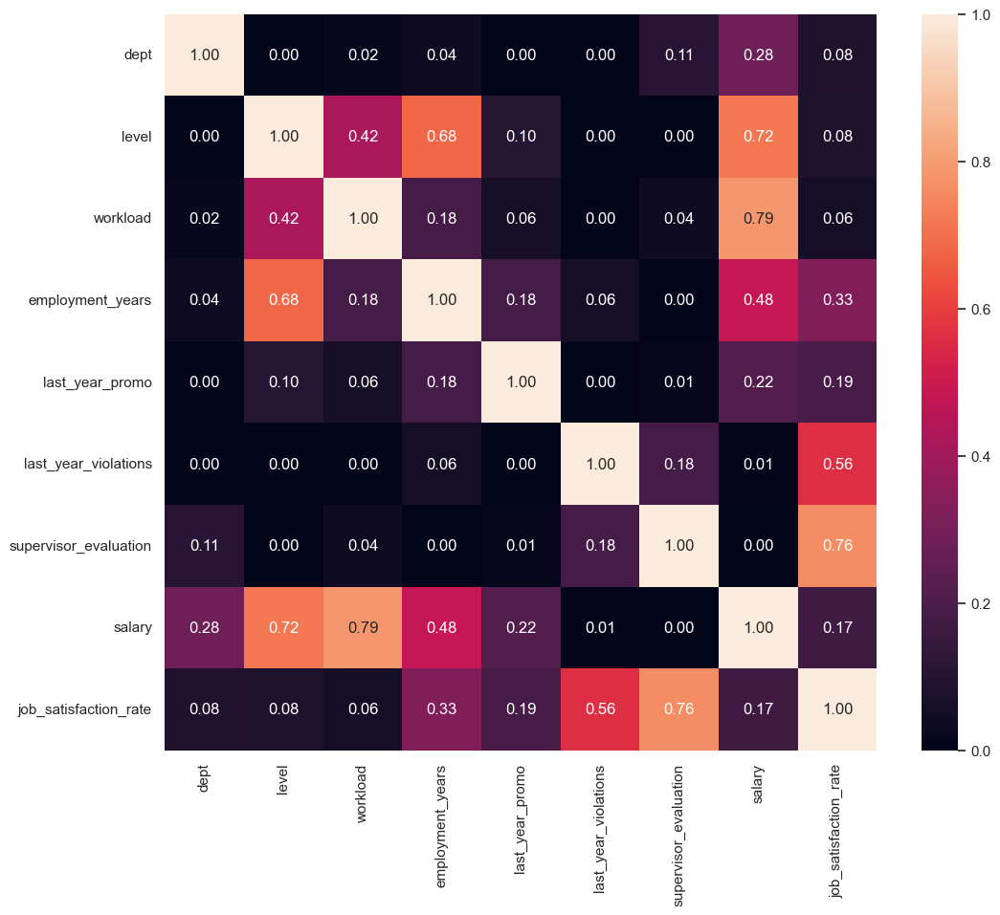

In [13]:
# Построение тепловой карты
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_train, annot=True, fmt='.2f');

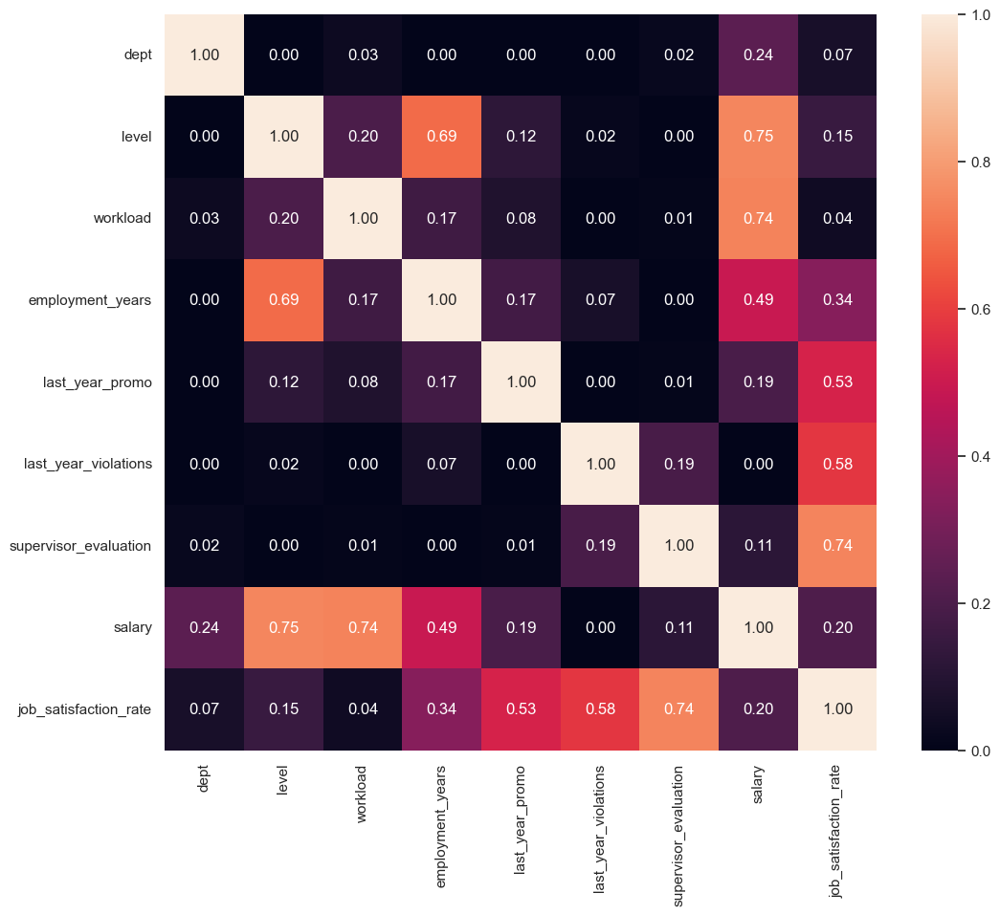

In [14]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_test, annot=True, fmt='.2f');

В данных нет существенных различий в части распределений признаков.
Мы наблюдаем сильную прямую связь между целевым признаком и `supervisor_evaluation`, среднюю прямую связь между целевым и `last_year_violations, employment_years`, а также слабую прямую связь между целевым и `last_year_promo, salary, dept, level, workload`.

**Мультиколлинеарность** между входными признаками **не наблюдается** коэффициент корреляции от 0.9 до 0.95 по модулю отсутствует. 

Посмотрим на взаимосвязь между целевым признаком и входными. Построим диаграммы рассеяния для признака `job_satisfaction_rate` и всех количественных признаков с учётом значения категориальных признаков.

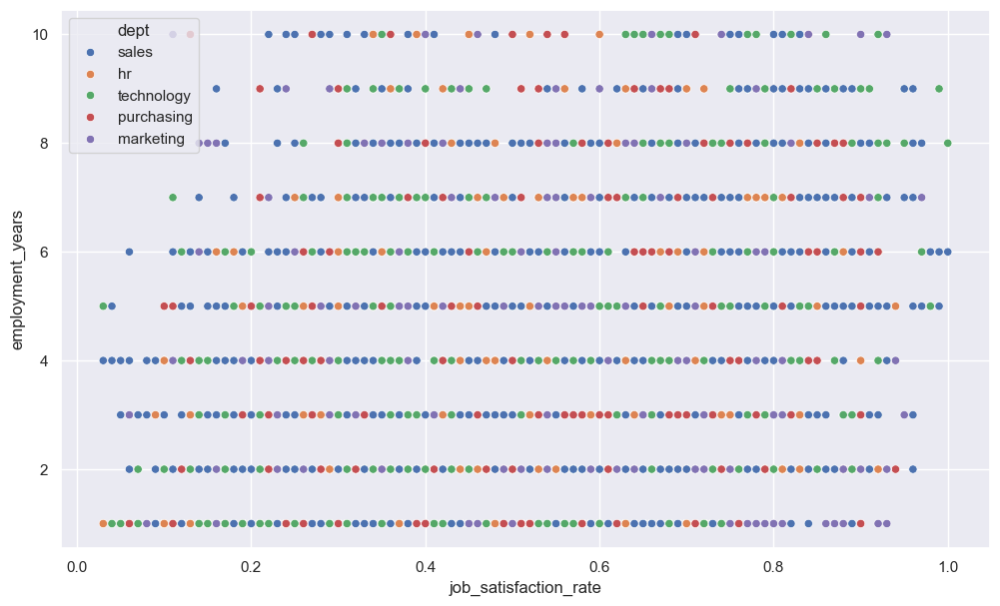

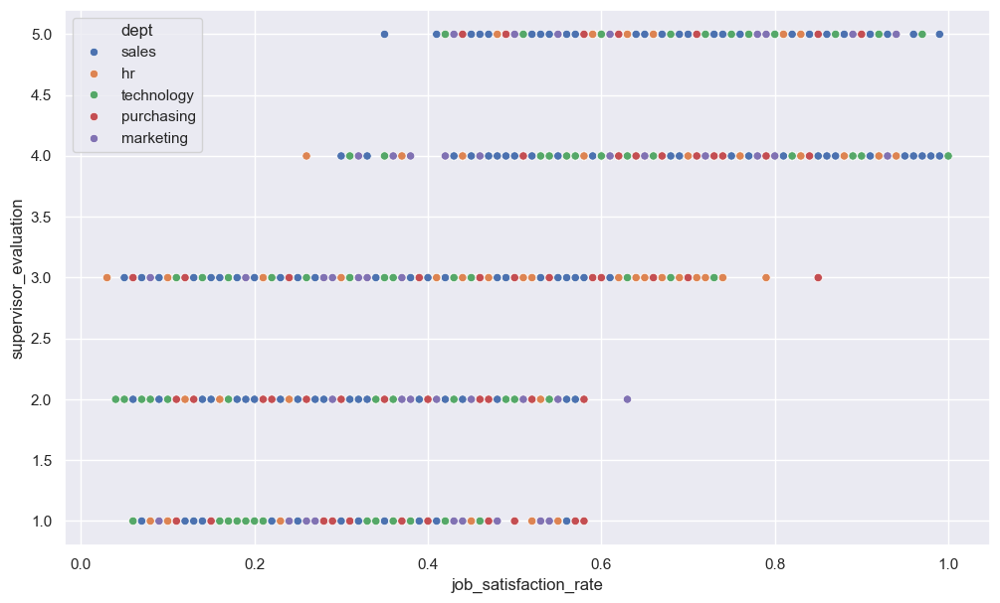

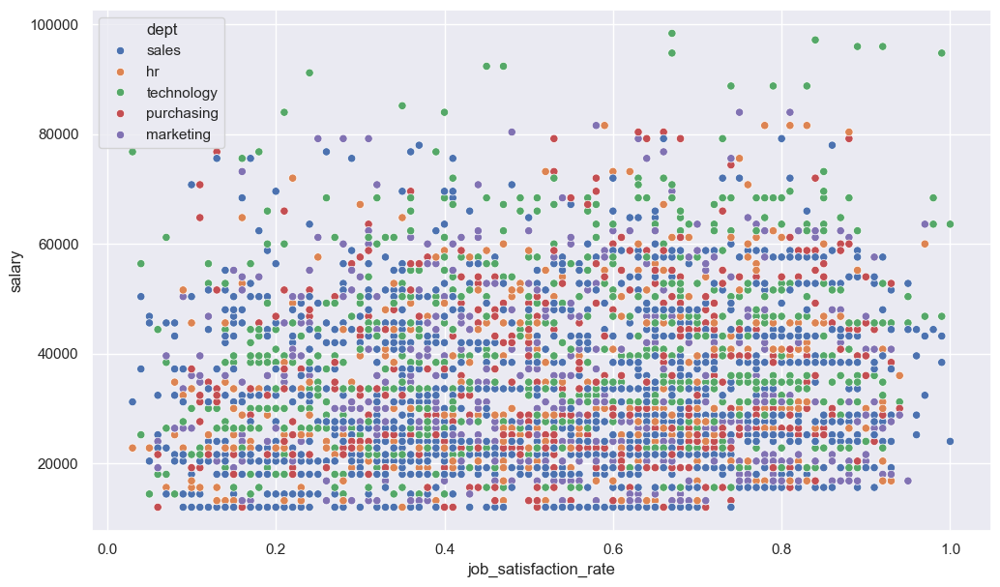

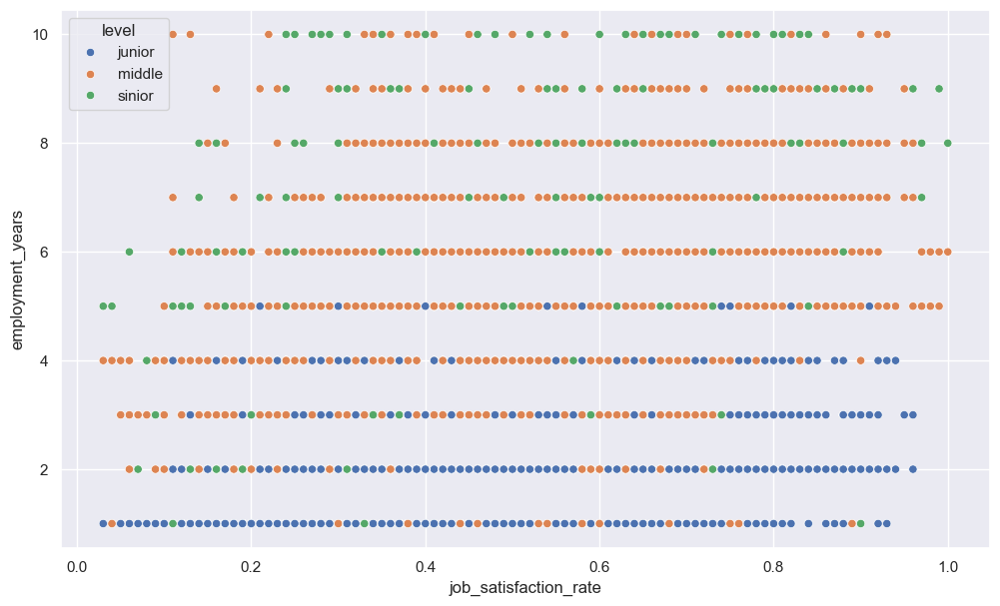

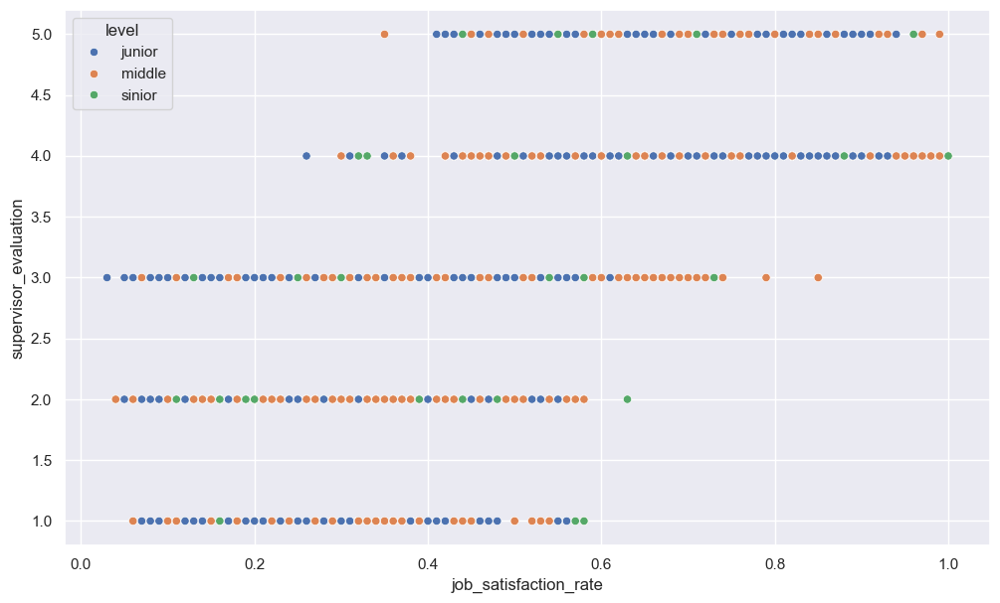

...

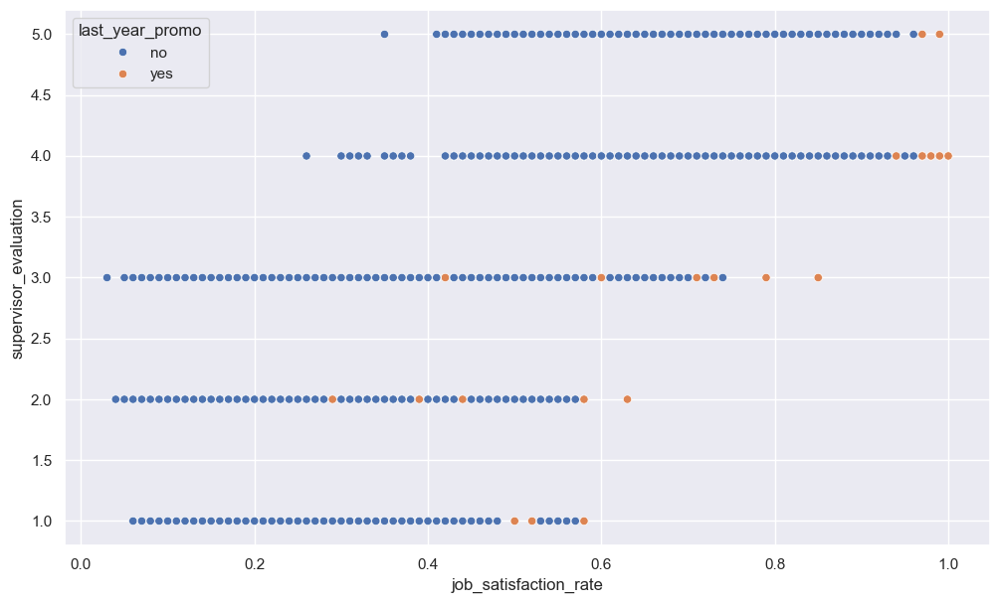

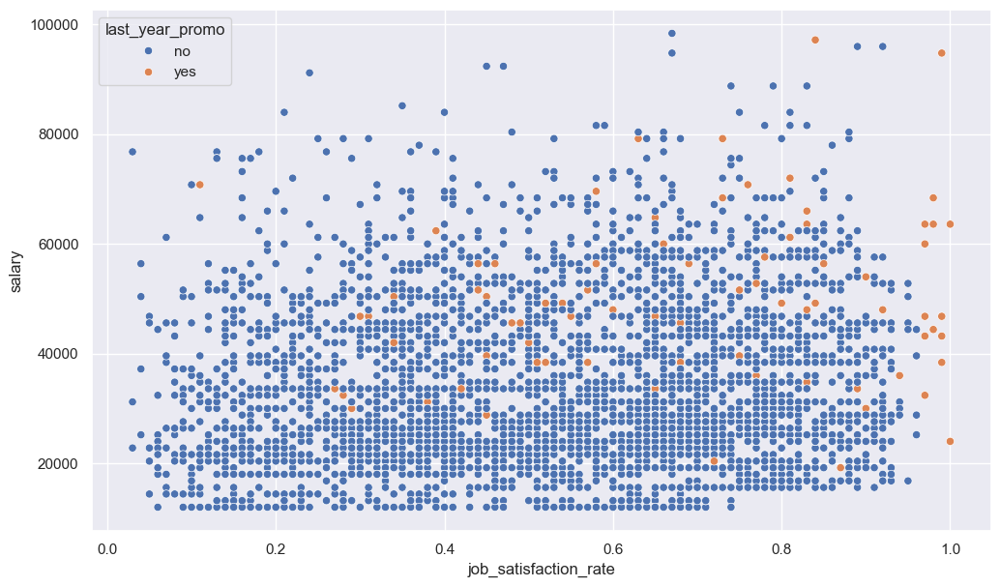

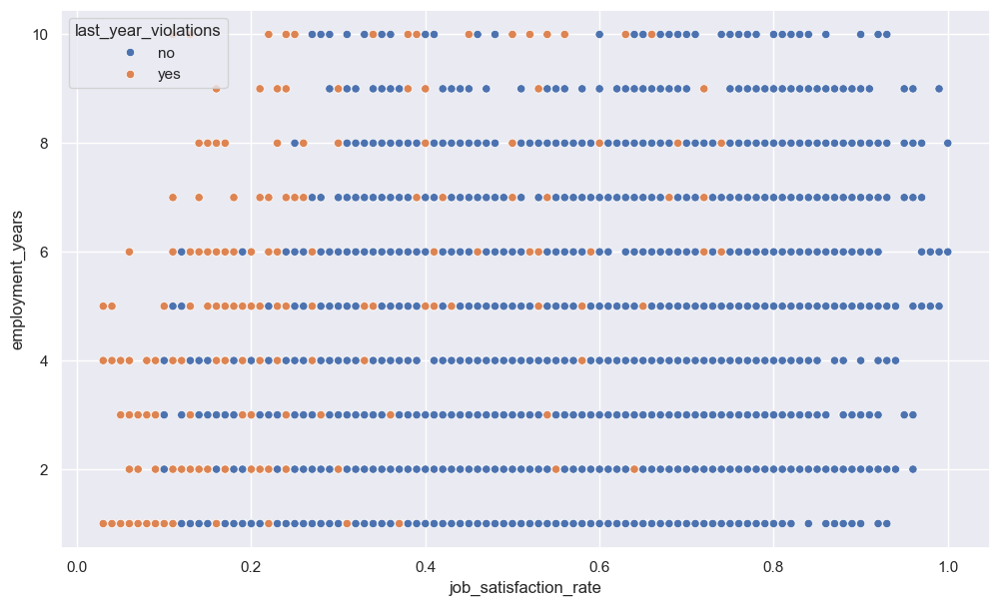

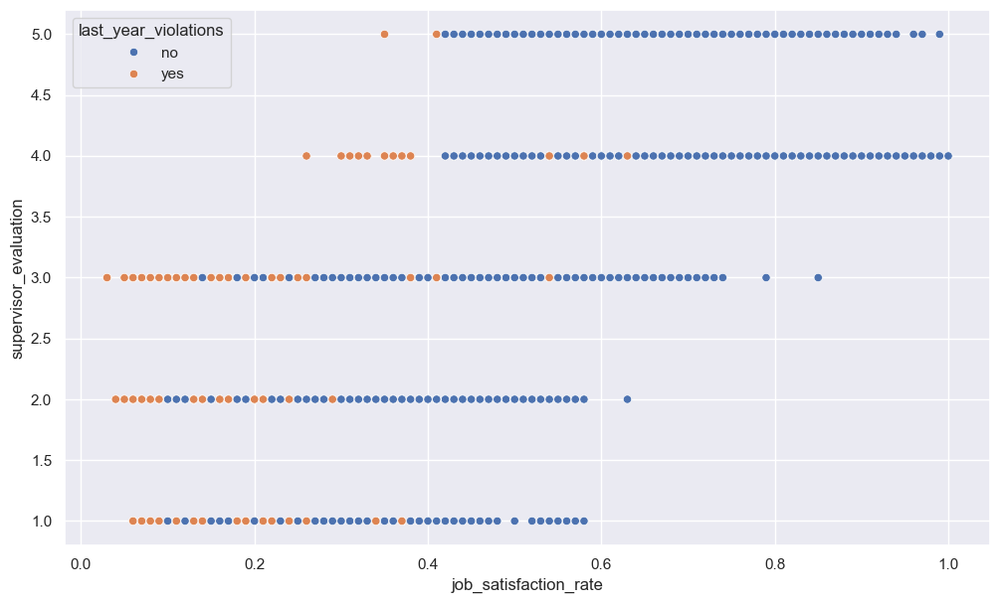

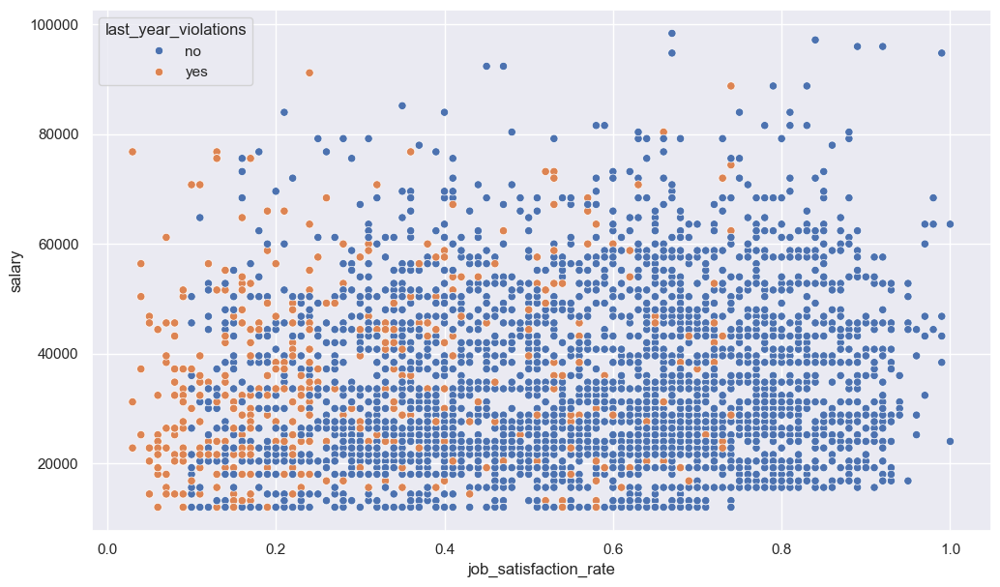

In [15]:
for cat in train_rate.select_dtypes(include=['object']).columns:
    for col in train_rate.select_dtypes(include=['int','float']).columns:
        if col not in ['job_satisfaction_rate','id']:
            plt.figure(figsize=(12,7))
            sns.scatterplot(data=train_rate, x='job_satisfaction_rate', y=col, hue=cat);

Мы видим, что признаки `epmloyment_years, supervisor_evaluation` имеют разные зависимости на конкретных значениях, учтем это при обработке признаков как категориальных, признак `salary` нелинейно связан с целевым, что может повлиять на качество линейной модели.

Построим диаграммы рассеяния для тестовой выборки.


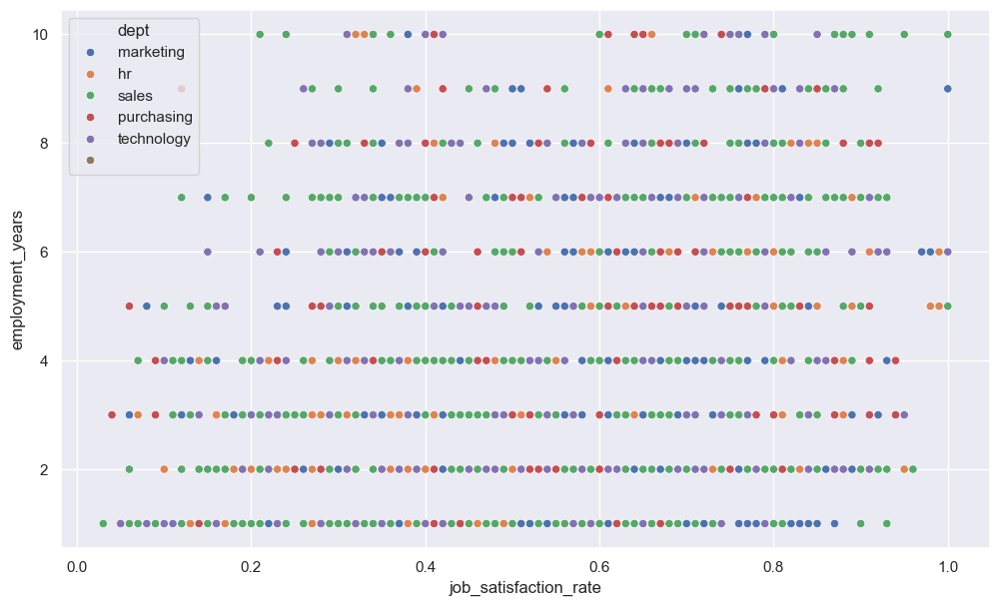

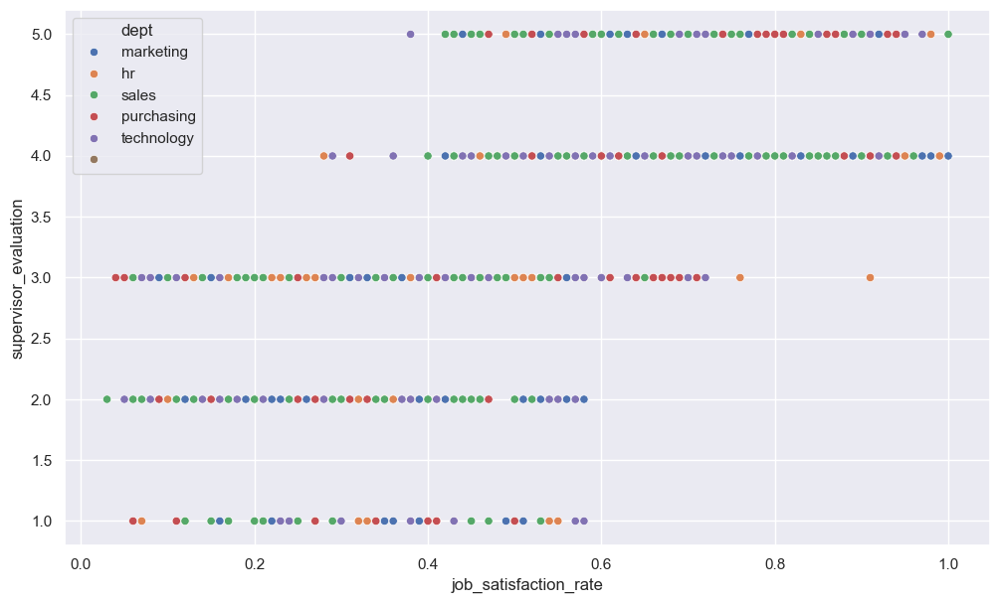

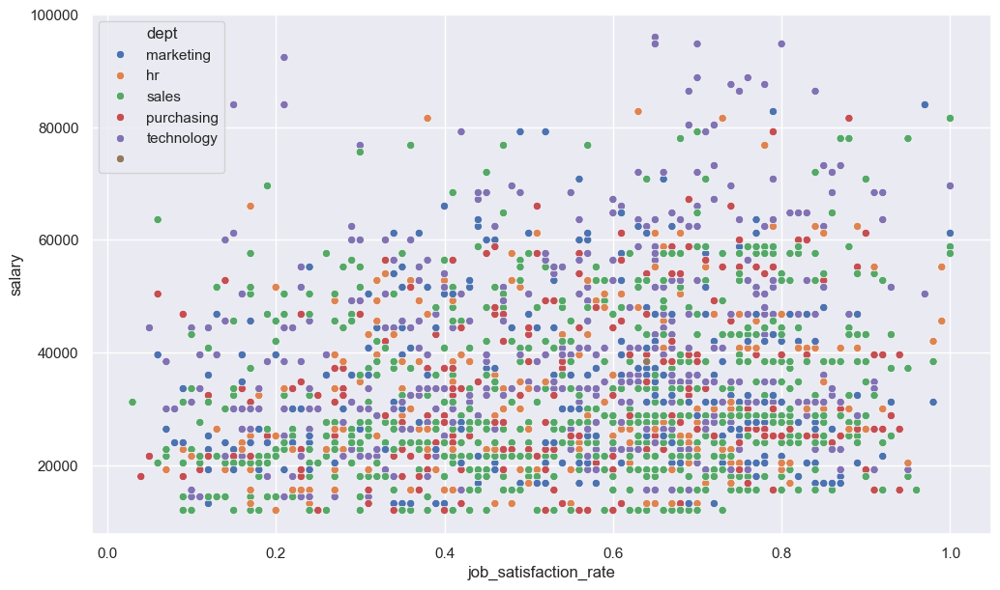

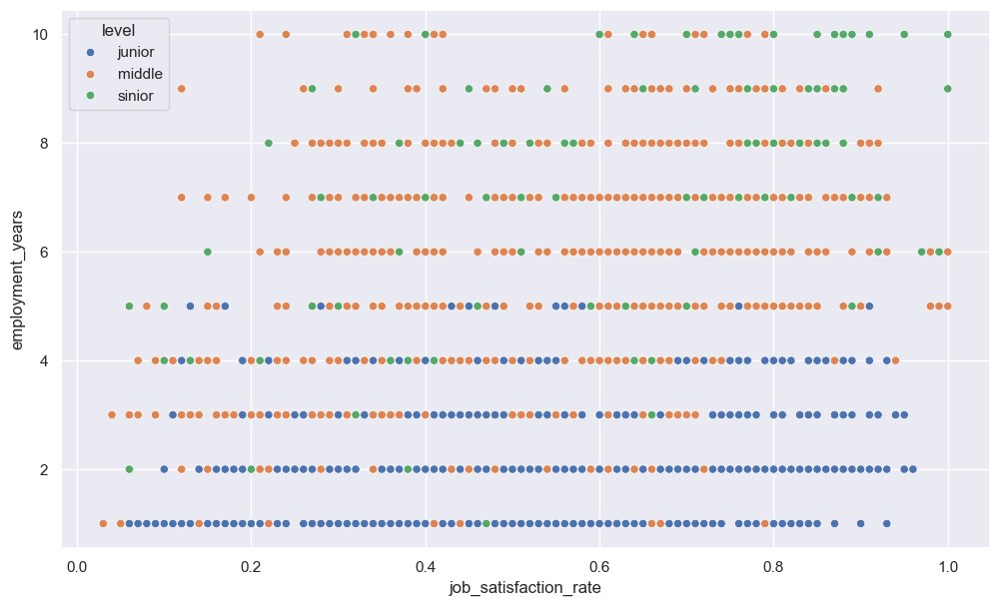

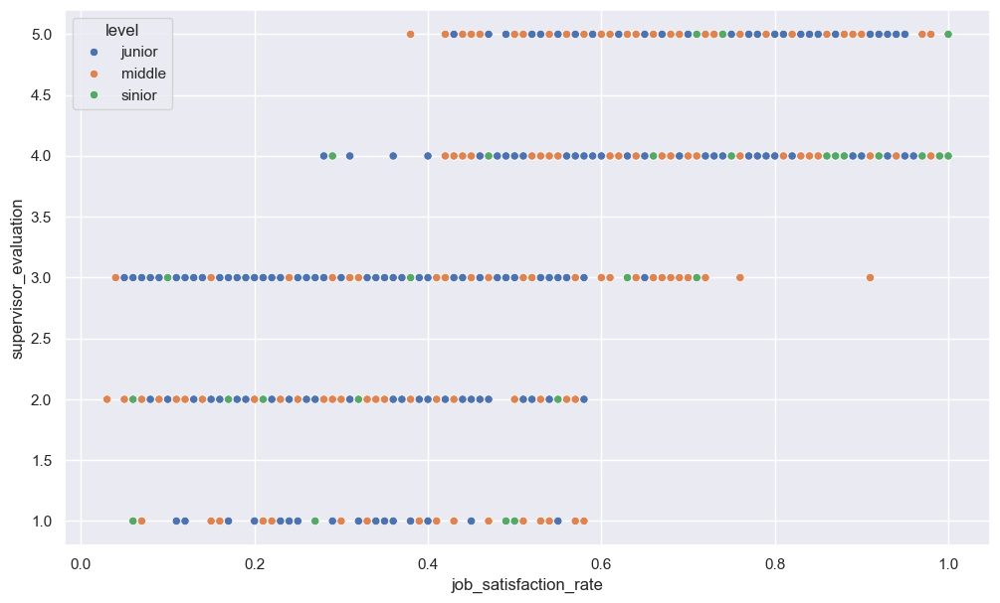

...

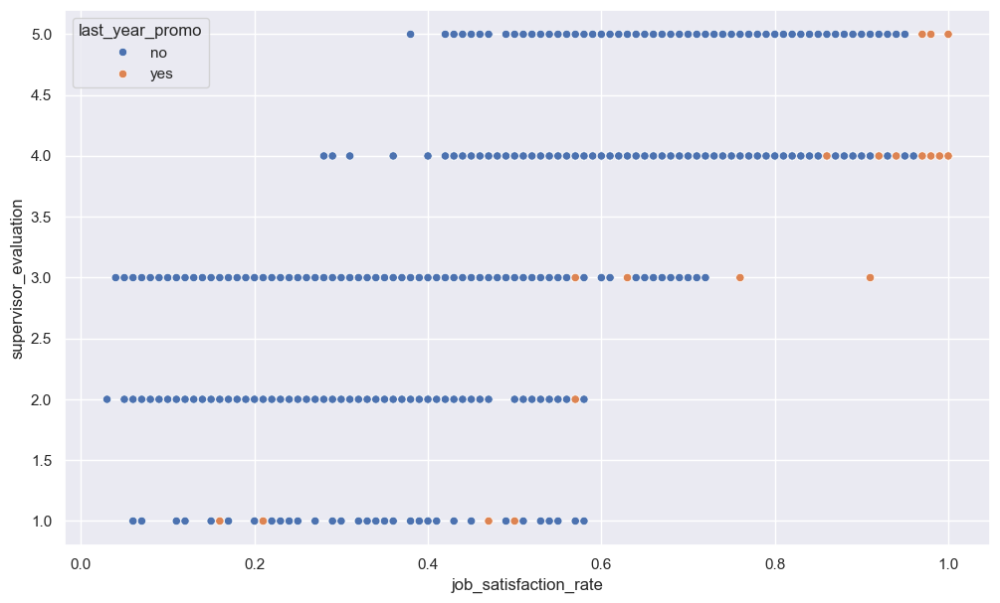

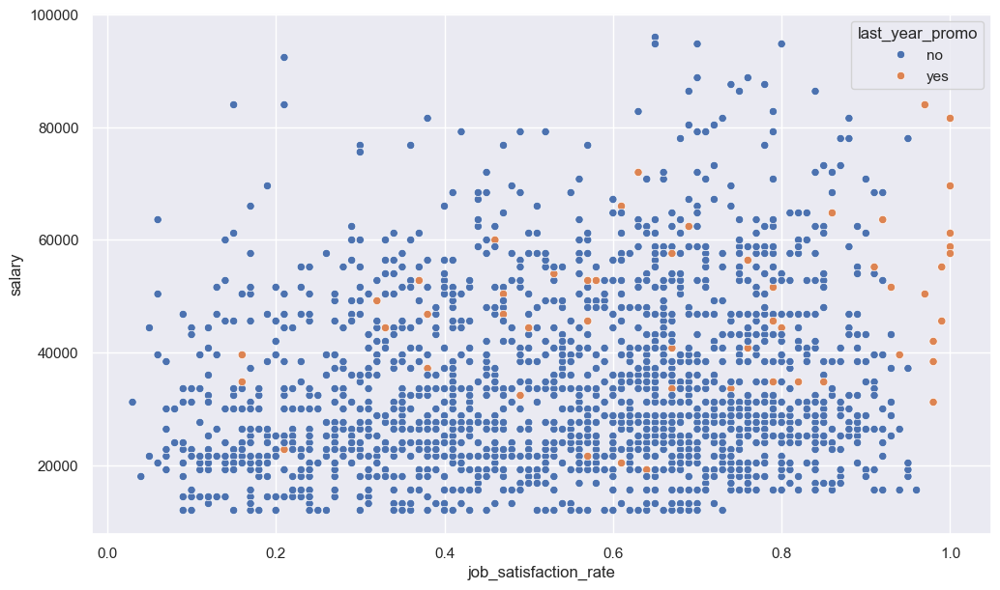

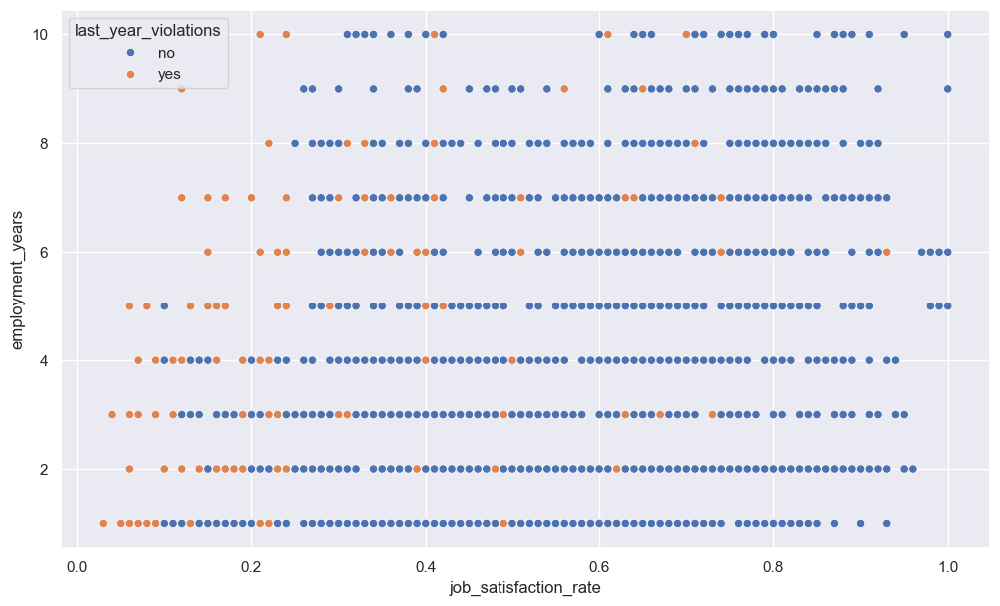

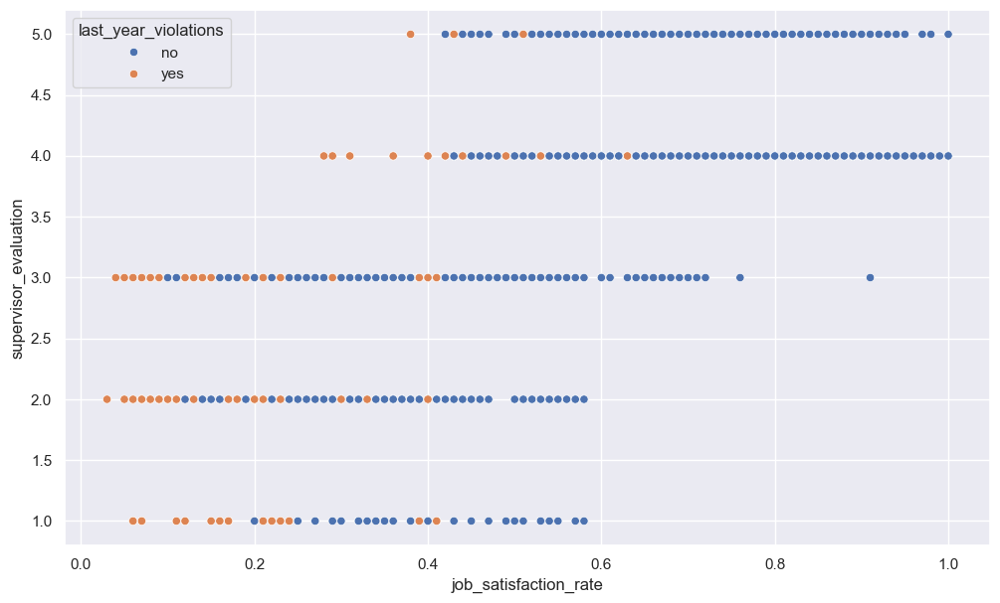

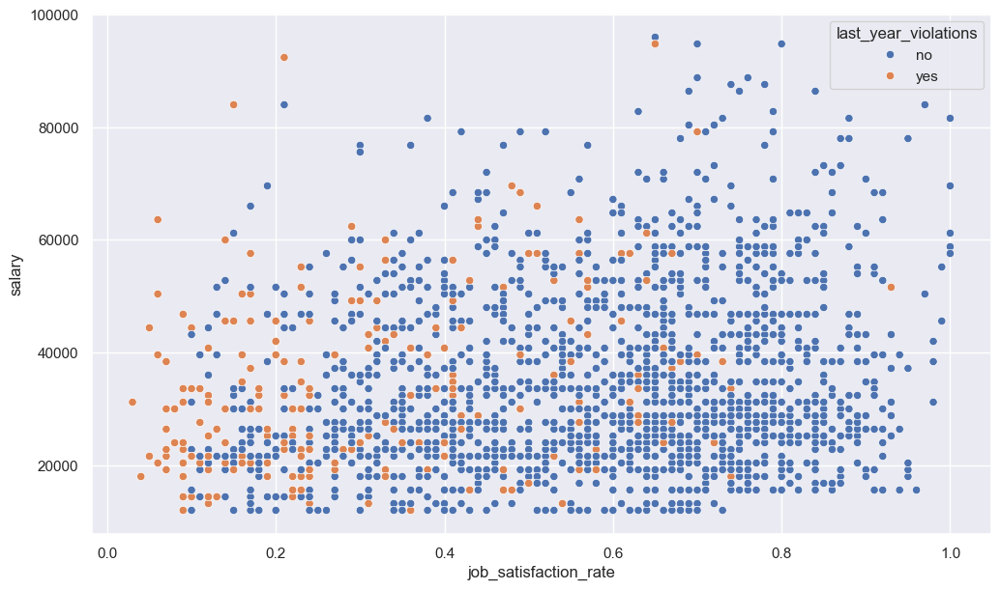

In [16]:
for cat in test_features.select_dtypes(include=['object']).columns:
    for col in test_features.select_dtypes(include=['int','float']).columns:
        if col not in ['job_satisfaction_rate','id']:
            plt.figure(figsize=(12,7))
            sns.scatterplot(data=test_features.merge(target_satisfaction, on='id'),
                            x='job_satisfaction_rate', y=col, hue=cat);

Диаграмма рассеяния тестовой и тренировочной выборки не имеет существенных различий, значит оценка модели, полученная на тестовой выборке будет корректной. 

**Вывод:** таким образом, мы провели статистический анализ количественных и категориальных признаков, а также корреляционный анализ. Аномальные значения не обнаружены, тестовая и тренировочная выборка серьезных различий не имеют, мультиколлинеарность между входными признаками отсутствует, связь между целевым и входными признаками изучена.

### **Подготовка данных**
<a id='pipeline1'></a>

Разобьем тренировочные и тестовые данные на входные и целевой признаки.

In [17]:
# Сохраняем  id работников из тестовых данных
test_ids = target_satisfaction['id']

In [18]:
train_rate = train_rate.drop('id', axis=1)
# Проверка наличия явных дубликатов
train_rate.duplicated().sum()

245

In [19]:
# Удаление явных дубликатов
train_rate = train_rate.drop_duplicates().reset_index(drop=True)

In [20]:
X_train, y_train = train_rate.drop('job_satisfaction_rate', axis=1), train_rate['job_satisfaction_rate']

In [21]:
X_test, y_test = test_features.drop('id', axis=1), target_satisfaction.drop('id', axis=1)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3755, 8), (3755,), (2000, 8), (2000, 1))

Подготовим данные, количественные и категориальные признаки обработаем в пайплайне.

In [22]:
# Создаём списки с названиями признаков
ohe_columns = ['dept', 'last_year_promo', 'last_year_violations']
ord_columns = ['level', 'workload']
num_columns = ['salary','employment_years', 'supervisor_evaluation']

# Кодируем категориальные значения
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe', 
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore')
        )
    ]
)

ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder( 
         categories=[['junior', 'middle', 'senior'],
                    ['low', 'medium', 'high']], 
         handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

# Создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', MinMaxScaler(), num_columns)
    ], 
    remainder='passthrough'
)

# Создаём итоговый пайплайн: подготовка данных и модель
pipe_final= Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('feature_selection', SelectKBest(f_classif, k=10)),
        ('models', LinearRegression())
    ]
)

**Вывод:** таким образом, мы подготовили данные для дальнейшего обучения на них моделей.

### **Обучение моделей**
<a id='model1'></a>

Создадим словарь для подбора лучших гиперпараметров моделей.

In [23]:
param_grid = [
    # словарь для модели DecisionTreeRegressor()
    {
        'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 4),
        'models__min_samples_split':[2, 0.1, 0.2, 0.3],
        'models__min_samples_leaf':range(1, 5),
        'models__max_features': range(2,4),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'],
        'feature_selection__k': [2, 4, 8]
    },

    # словарь для модели LinearRegression() 
    {
        'models':[LinearRegression()],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'],
        'feature_selection__k': [2, 4, 8]
    }
    
]

Используем один общий пайплайн для всех моделей и инструмент подбора гиперпараметров, который вернёт нам лучшую модель.

В качестве метрики возьмем SMAPE (англ. symmetric mean absolute percentage error, «симметричное среднее абсолютное процентное отклонение»), напишем функцию для ее вычисления.

In [24]:
# Напишем функцию для новой метрики
def smape_metric(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    numerator = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred))
    smape = np.where(denominator == 0, 0, numerator / denominator)
    return 100 * np.mean(smape)

# Создаем пользовательскую метрику
smape_score = make_scorer(smape_metric, greater_is_better=False)

In [25]:
# Производим подбор гиперпараметров с помощью RandomizedSearchCV
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid,
    cv=5,
    scoring=smape_score,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train)


print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_[0],'\n',
      randomized_search.best_estimator_[2], '\n')
print ('Метрика лучшей модели на кросс-валидации:', abs(randomized_search.best_score_))
dummy_regr = DummyRegressor()
dummy_regr.fit(X_train, y_train)
y_dummy_pred = dummy_regr.predict(X_test)
print('Метрика константной модели на тестовой выборке:', smape_metric(y_test, y_dummy_pred))

Лучшая модель и её параметры:

 ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'))]),
                                 ['dept', 'last_year_promo',
                                  'last_year_violations']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['junior',
                  

In [26]:
y_test_pred = randomized_search.best_estimator_.predict(X_test)
print(f'Метрика SMAPE на тестовой выборке: {smape_metric(y_test, y_test_pred)}')

Метрика SMAPE на тестовой выборке: 23.78031717891202


/Users/ajmailova/miniconda3/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [27]:
# Убедимся, что для test предсказания и ответы сравниваются для одного и того же работника.
# Создаем DataFrame для сравнения
results = pd.DataFrame({
    'id': test_ids,
    'real_rate': y_test.values.ravel(), 
    'predicted_rate': y_test_pred
})
results.head(10)

,id,real_rate,predicted_rate
0,130604,0.74,0.737304
1,825977,0.75,0.626998
2,418490,0.60,0.737304
3,555320,0.72,0.737304
4,826430,0.08,0.737304
5,817219,0.76,0.404626
6,269033,0.64,0.404626
7,962356,0.38,0.737304
8,649052,0.14,0.587607
9,532834,0.59,0.147363


Строка с id=817219: реальный рейтинг = 0.76, предсказанный = 0.404626.

Строка с id=649052: реальный = 0.14, предсказанный = 0.587607.

Это значит, что предсказания **не** привязаны к правильным работникам.

In [28]:
# Пересортируем данные
results_correct = pd.merge(
    test_features[['id']],
    pd.DataFrame({'id': test_ids, 'predicted_rate': y_test_pred}),
    on='id',
    how='left'
)
results_correct = pd.merge(
    results_correct,
    target_satisfaction[['id', 'job_satisfaction_rate']],
    on='id',
    how='left'
)


In [29]:
print('Метрика константной модели на тестовой выборке:', smape_metric(y_test, y_dummy_pred))
print('Метрика SMAPE на тестовой выборке:',smape_metric(results_correct['job_satisfaction_rate'], y_test_pred))

Метрика константной модели на тестовой выборке: 19.131128951011192
Метрика SMAPE на тестовой выборке: 10.597190454705574


**Вывод:** лучшая модель имеет следующие параметры: 

**DecisionTreeRegressor**(max_depth=3, max_features=2, min_samples_split=0.1,
                      random_state=42),

метрика SMAPE на тестовой выборке: 10.6, а на кросс-валидации составляет 11.4 - успешный результат.

Дерево решений в данной ситуации показало себя лучше, потому что хорошо справляется с нелинейностью признаков

### **Общая информация**
<a id='info2'></a>

In [31]:
# Загружаем файлы
train_quit = pd.read_csv('train_quit.csv')
test_features = pd.read_csv('test_features.csv')
target_quit = pd.read_csv('test_target_quit.csv')

In [32]:
# Создаем функцию для получения общей информации
def general_info(df):
    return df.info(), display(df.shape, df.head())

In [33]:
# Посмотрим на первые 5 строк каждого датасета и общую информацию
general_info(train_quit)
general_info(test_features)
general_info(target_quit)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     4000 non-null   int64 
 1   dept                   4000 non-null   object
 2   level                  4000 non-null   object
 3   workload               4000 non-null   object
 4   employment_years       4000 non-null   int64 
 5   last_year_promo        4000 non-null   object
 6   last_year_violations   4000 non-null   object
 7   supervisor_evaluation  4000 non-null   int64 
 8   salary                 4000 non-null   int64 
 9   quit                   4000 non-null   object
dtypes: int64(4), object(6)
memory usage: 312.6+ KB


(4000, 10)

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
0,723290,sales,middle,high,2,no,no,4,54000,no
1,814010,sales,junior,medium,2,no,no,4,27600,no
2,155091,purchasing,middle,medium,5,no,no,1,37200,no
3,257132,sales,junior,medium,2,no,yes,3,24000,yes
4,910140,marketing,junior,medium,2,no,no,5,25200,no


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   id                     2000 non-null   int64 
 1   dept                   1998 non-null   object
 2   level                  1999 non-null   object
 3   workload               2000 non-null   object
 4   employment_years       2000 non-null   int64 
 5   last_year_promo        2000 non-null   object
 6   last_year_violations   2000 non-null   object
 7   supervisor_evaluation  2000 non-null   int64 
 8   salary                 2000 non-null   int64 
dtypes: int64(4), object(5)
memory usage: 140.8+ KB


(2000, 9)

,id,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
0,485046,marketing,junior,medium,2,no,no,5,28800
1,686555,hr,junior,medium,1,no,no,4,30000
2,467458,sales,middle,low,5,no,no,4,19200
3,418655,sales,middle,low,6,no,no,4,19200
4,789145,hr,middle,medium,5,no,no,5,40800


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2000 non-null   int64 
 1   quit    2000 non-null   object
dtypes: int64(1), object(1)
memory usage: 31.4+ KB


(2000, 2)

,id,quit
0,999029,yes
1,372846,no
2,726767,no
3,490105,no
4,416898,yes


(None, None)

**`train_quit.csv`** содержит **4000 строк и 10 столбцов**.

**`test_features.csv`** содержит **2000 строк и 9 столбцов**.

**`test_target_quit.csv`** содержит **2000 строк и 2 столбца**.

В данных присутствуют пропуски (заполним их в пайплайне), типы данных корректны.

### **Предобработка данных**
<a id='preprocessing2'></a>

#### **Явные и неявные дубликаты**

Проверим количество **неявных** дубликатов в данных.

In [34]:
# Напишем функцию для уникальных значений категориальных столбцов
def cat_unique(df):
    columns = df.select_dtypes(exclude='number').columns.to_list()
    for col in columns:
         display(col, df[col].unique())

In [35]:
# Выведем уникальные значения категориальных столбцов 
cat_unique(train_quit)
cat_unique(test_features)
cat_unique(target_quit)

'dept'

array(['sales', 'purchasing', 'marketing', 'technology', 'hr'],
      dtype=object)

'level'

array(['middle', 'junior', 'sinior'], dtype=object)

'workload'

array(['high', 'medium', 'low'], dtype=object)

'last_year_promo'

array(['no', 'yes'], dtype=object)

'last_year_violations'

array(['no', 'yes'], dtype=object)

'quit'

array(['no', 'yes'], dtype=object)

'dept'

array(['marketing', 'hr', 'sales', 'purchasing', 'technology', nan, ' '],
      dtype=object)

'level'

array(['junior', 'middle', 'sinior', nan], dtype=object)

'workload'

array(['medium', 'low', 'high', ' '], dtype=object)

'last_year_promo'

array(['no', 'yes'], dtype=object)

'last_year_violations'

array(['no', 'yes'], dtype=object)

'quit'

array(['yes', 'no'], dtype=object)

Неявные дубликаты не обнаружены. Помимо пропущенных значений, в категориальных признаках присутствует значение ' '. Заменим его на пропущенное NaN.

In [36]:
test_features['dept'] = test_features['dept'].replace(' ', np.nan)
test_features['workload'] = test_features['workload'].replace(' ', np.nan)
train_quit['level'] = train_rate['level'].replace('sinior', 'senior')
test_features['level'] = test_features['level'].replace('sinior', 'senior')

Проверим количество **явных** дубликатов в тренировочных данных.

In [37]:
train_quit.duplicated().sum()

0

**Явные** дубликаты также не обнаружены.

**Вывод:** таким образом, мы провели предобработку данных и проверили наличие явных и неявных дубликатов в данных.

### **Исследовательский анализ данных**
<a id='EDA2'></a>

#### **Статистический анализ количественных признаков**

In [38]:
# Выведем статистики количественных признаков
display(train_quit.drop('id', axis=1).describe(), test_features.drop('id', axis=1).describe())

,employment_years,supervisor_evaluation,salary
count,4000.000000,4000.000000,4000.000000
mean,3.701500,3.474750,33805.800000
std,2.541852,1.004049,15152.415163
min,1.000000,1.000000,12000.000000
25%,2.000000,3.000000,22800.000000
50%,3.000000,4.000000,30000.000000
75%,6.000000,4.000000,43200.000000
max,10.000000,5.000000,96000.000000


,employment_years,supervisor_evaluation,salary
count,2000.000000,2000.000000,2000.000000
mean,3.666500,3.526500,34066.800000
std,2.537222,0.996892,15398.436729
min,1.000000,1.000000,12000.000000
25%,1.000000,3.000000,22800.000000
50%,3.000000,4.000000,30000.000000
75%,6.000000,4.000000,43200.000000
max,10.000000,5.000000,96000.000000


Во всех признаках минимальные и максимальные значения соответствуют реальности, среднее несильно отличается от медианы. Тренировочная выборка не имеет значительных различий с тестовой.

Построим графики для количественных признаков: гистограмму частотности распределения и ящик с усами.

In [39]:
# Определим функцию для построения гистрограммы
def hist_plot(df):
    for col in df.select_dtypes(include='number').columns:
        plt.figure(figsize=(16,7))
        df[col].hist(bins=50)
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

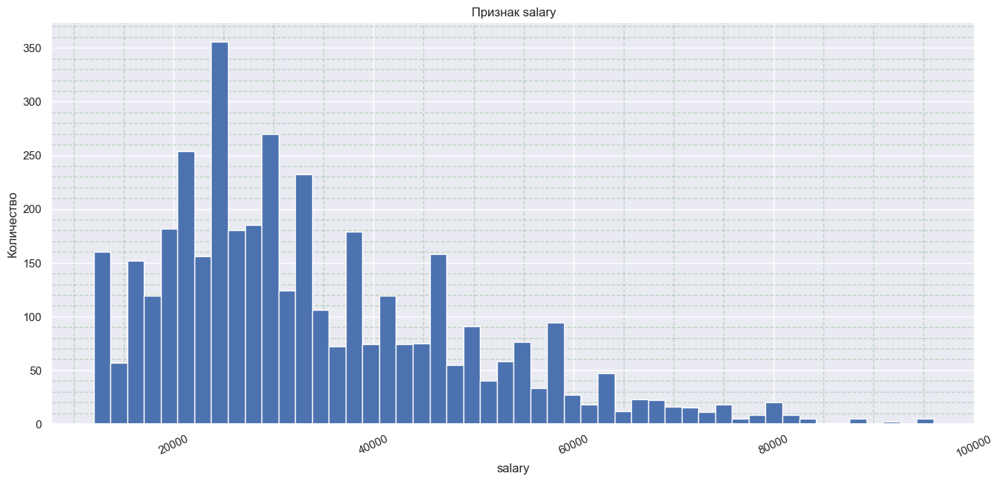

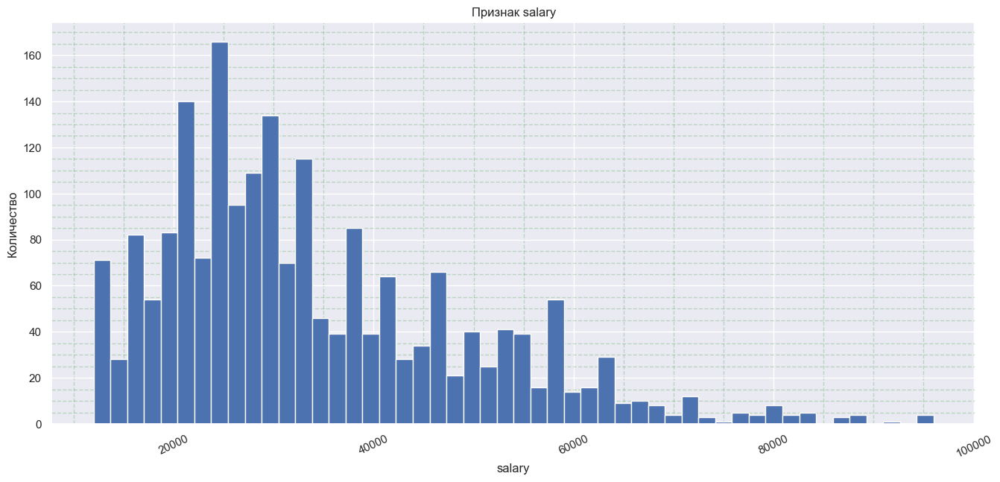

In [40]:
# Строим гистограмму
hist_plot(train_quit.drop(['id','employment_years','supervisor_evaluation'], axis=1))
hist_plot(test_features.drop(['id','employment_years','supervisor_evaluation'], axis=1))

Признаки не имеют сильных выбросов и аномалий, 

`epmloyment_years, supervisor_evaluation` - дискретные, 

`salary` - непрерывный.

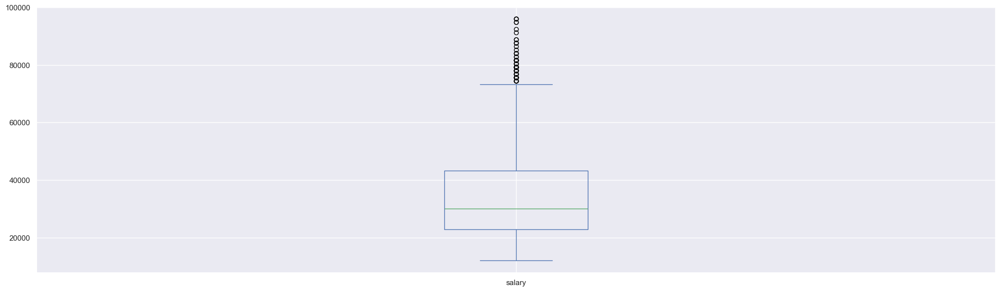

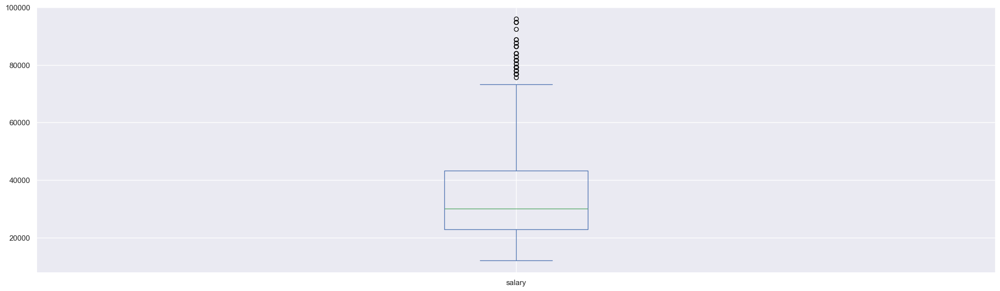

In [41]:
# Строим ящик с усами
train_quit.drop(['id','employment_years','supervisor_evaluation'], axis=1).plot(
    kind='box', 
    subplots=True, 
    sharey=False, 
    figsize=(25, 7)
)
test_features.drop(['id','employment_years','supervisor_evaluation'], axis=1).plot(
    kind='box', 
    subplots=True, 
    sharey=False, 
    figsize=(25, 7)
);

Признак `salary` имеет много выбросов сверху, это может быть связано со спецификой параметра и человеческим фактором.

Построим распределение дискретных признаков `employment_years и supervisor_evaluation`.

In [42]:
def disc_plot(df):
    for col in df[['employment_years', 'supervisor_evaluation']].columns:
        plt.figure(figsize=(16,7))
        sns.countplot(x=col, data=df, palette='viridis')
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


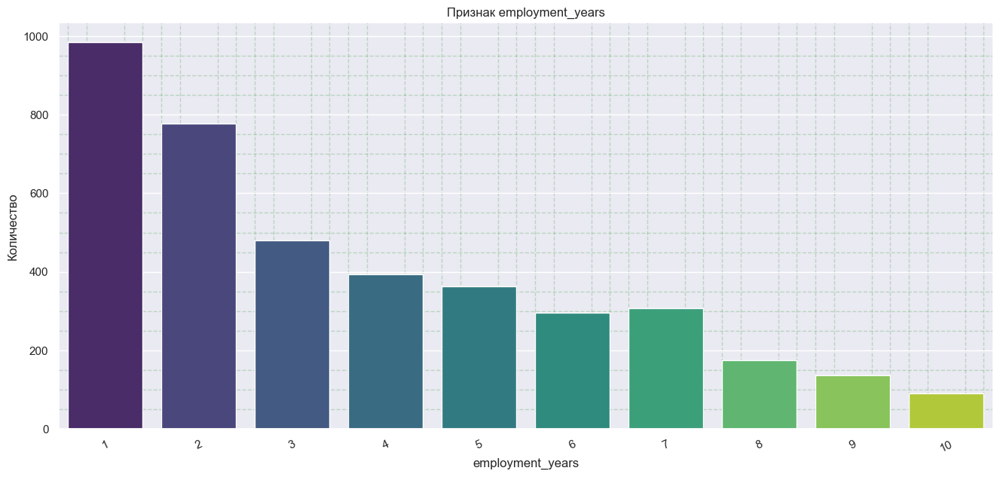

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


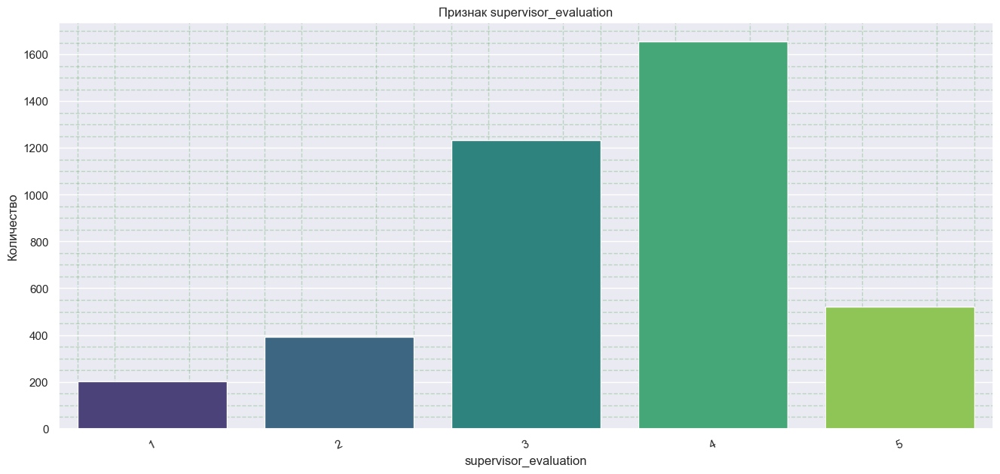

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


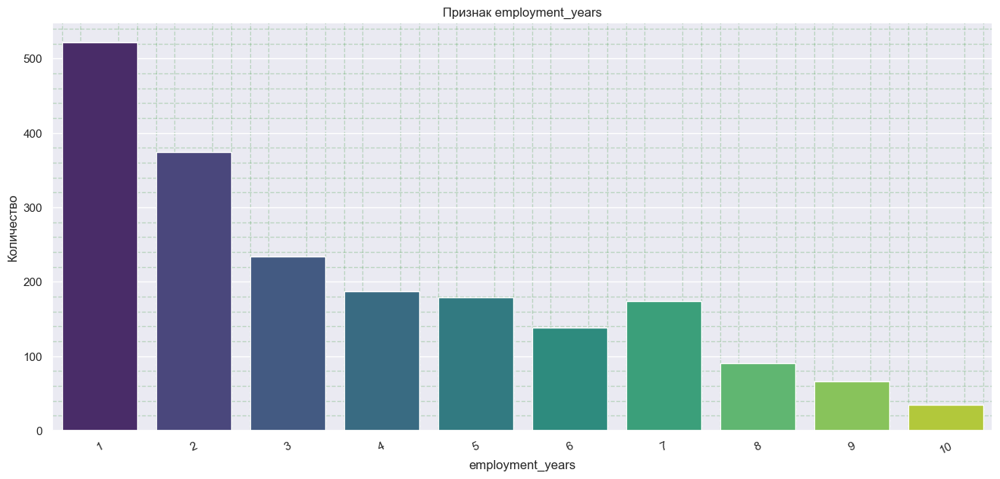

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/3948910898.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


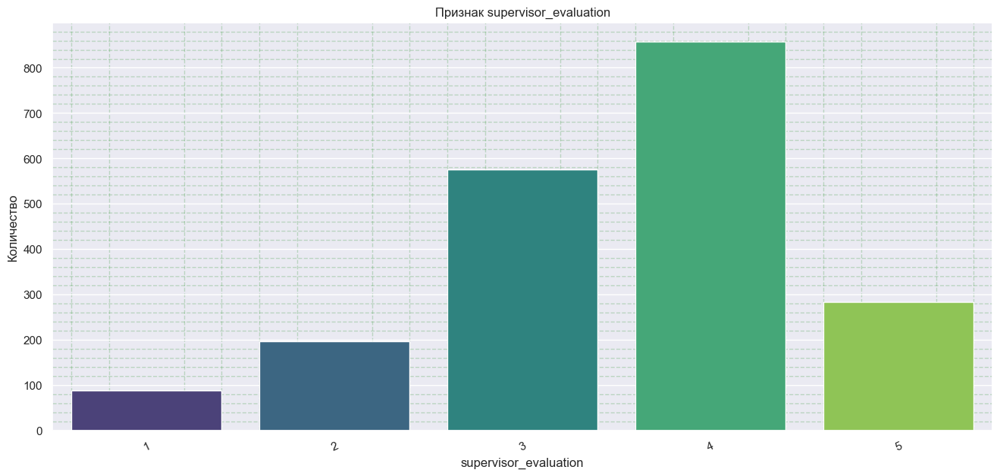

In [43]:
disc_plot(train_quit)
disc_plot(test_features)

Тестовые и тренировочные признаки распределены одинаково, в компании преимущественно находятся сотрудники с длительностью работы 1 год.

#### **Статистический анализ категориальных признаков**

In [45]:
# Создаем функцию, которая строит столбчатую диаграмму для каждого категориального столбца 
def cat_plot(df):
    for col in df.select_dtypes(include=['object']).columns:
        plt.figure(figsize=(16,7))
        sns.countplot(x=col, data=df, palette='viridis')
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Количество')
        plt.show()

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


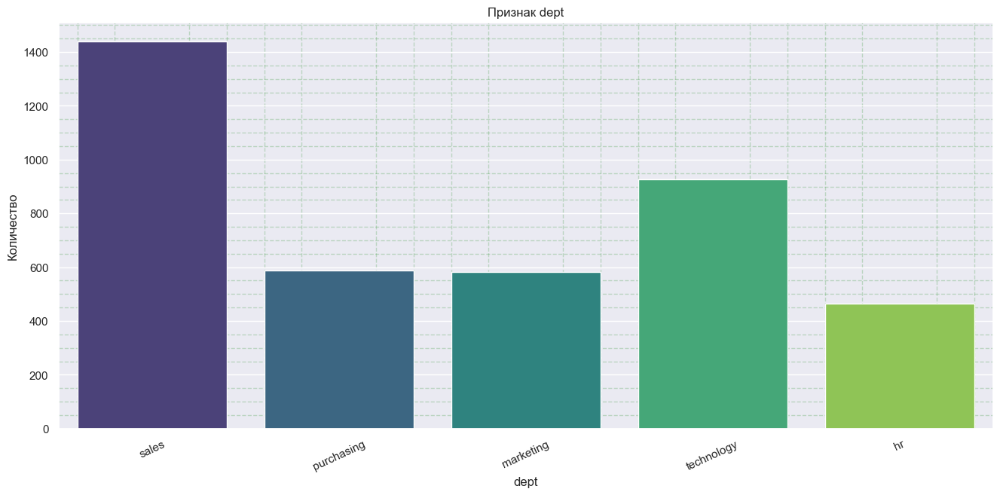

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


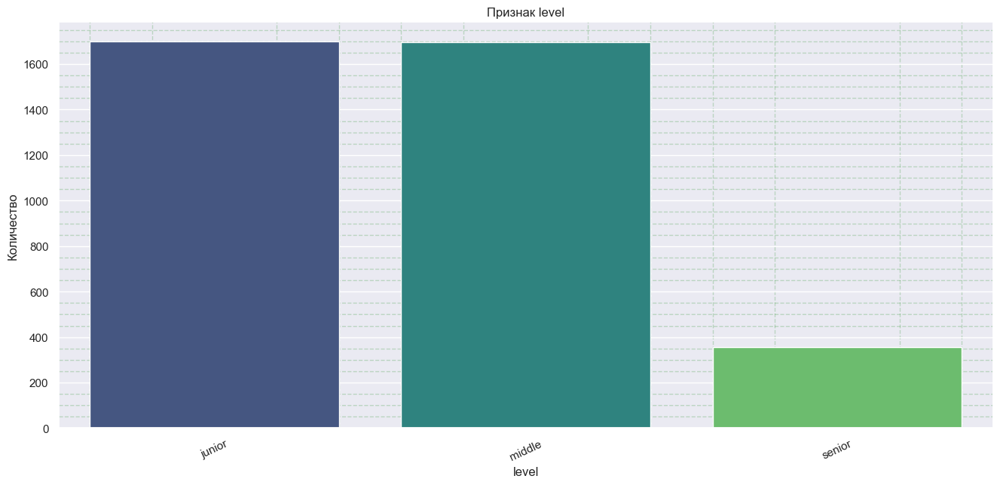

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


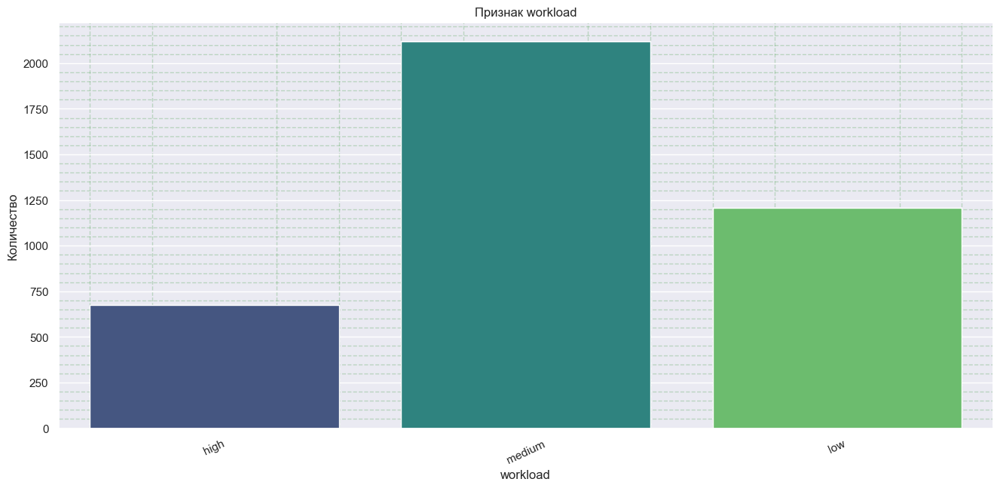

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


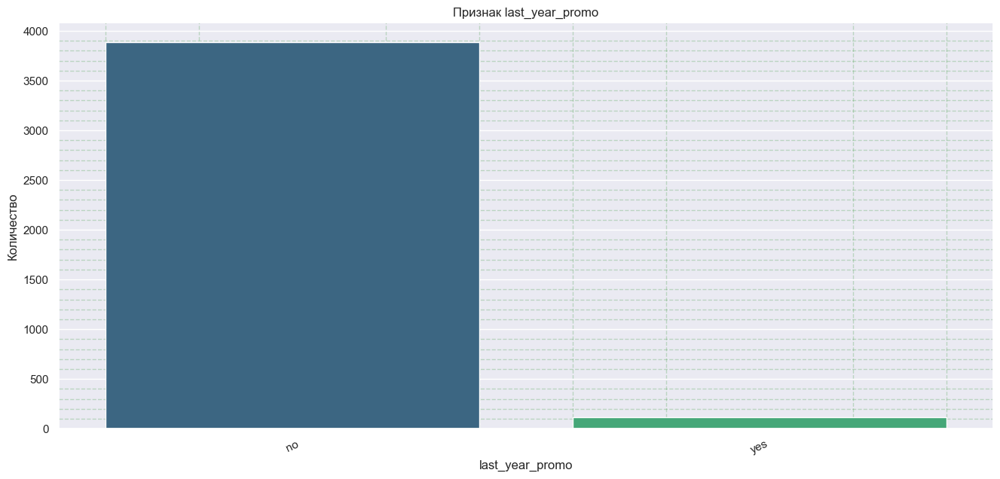

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


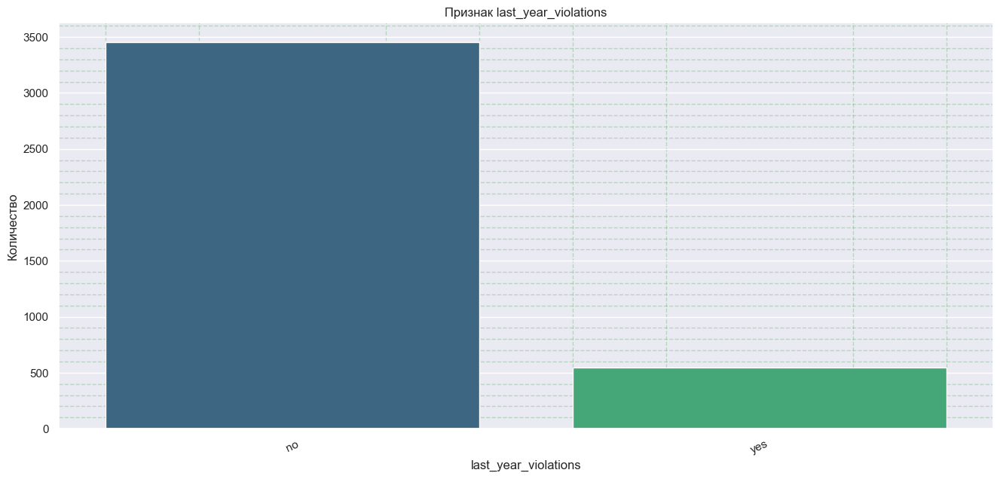

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


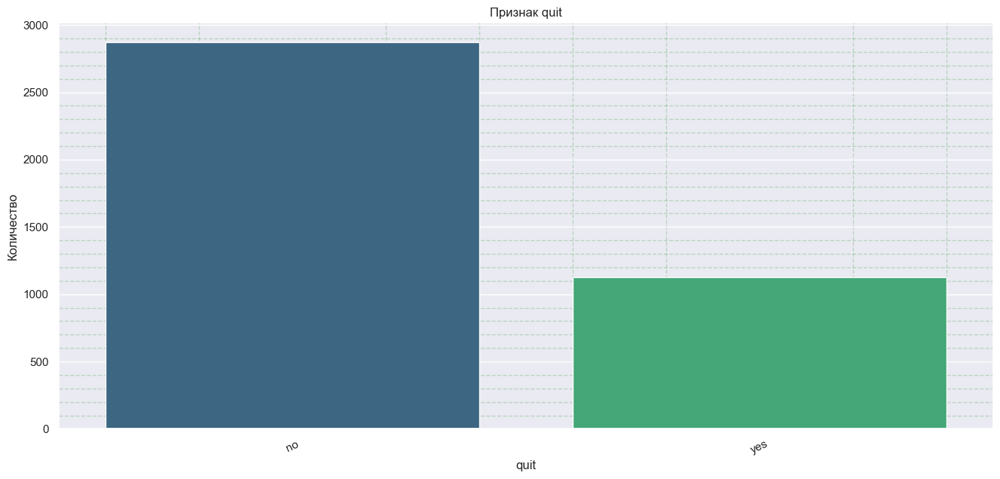

/var/folders/c3/s4tf13zx1ps6kcy79_nw6cz40000gn/T/ipykernel_50024/851589457.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


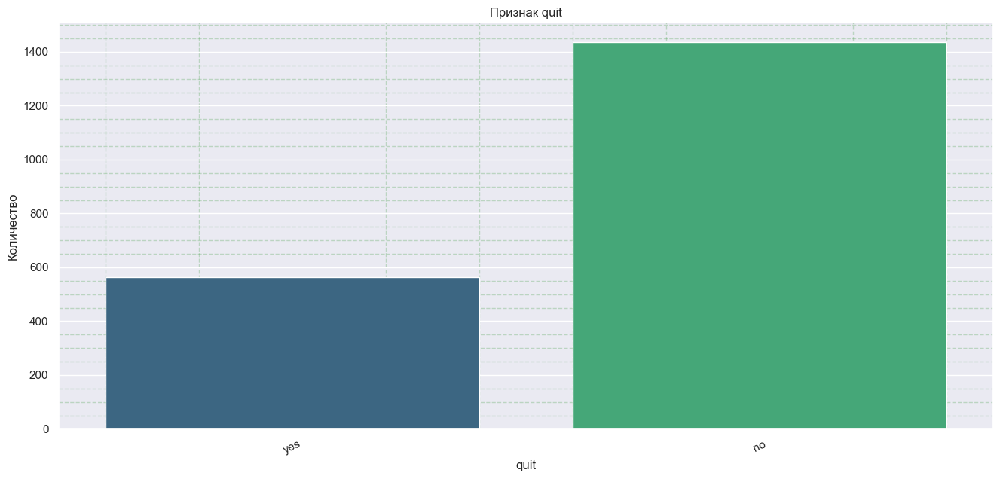

In [46]:
# Строим графики
cat_plot(train_quit)
cat_plot(target_quit)

Мы видим, что

- больше всего работает людей в отделе sales;

- в компании преобладает число сотрудников с уровнем junior;

- загруженность чаще всего средняя;

- повышение за последний год не было у большинства;

- сотрудники трудовой договор за последний год в основном не нарушали.

Мы имеем дело с дисбалансом классов в целевом признаке, учтем это в дальнейшем.

#### **Корреляционный анализ признаков в тренировочном датасете**

Изучим взаимосвязь между признаками: рассчитаем коэффициенты корреляции между всеми признаками и построим тепловую карту.

In [47]:
# Вычисление матрицы корреляции 
correlation_train = train_quit.drop('id', axis=1).phik_matrix(interval_cols=['salary'])
correlation_test = test_features.merge(target_quit,on='id').drop('id', axis=1).phik_matrix(interval_cols=['salary'])

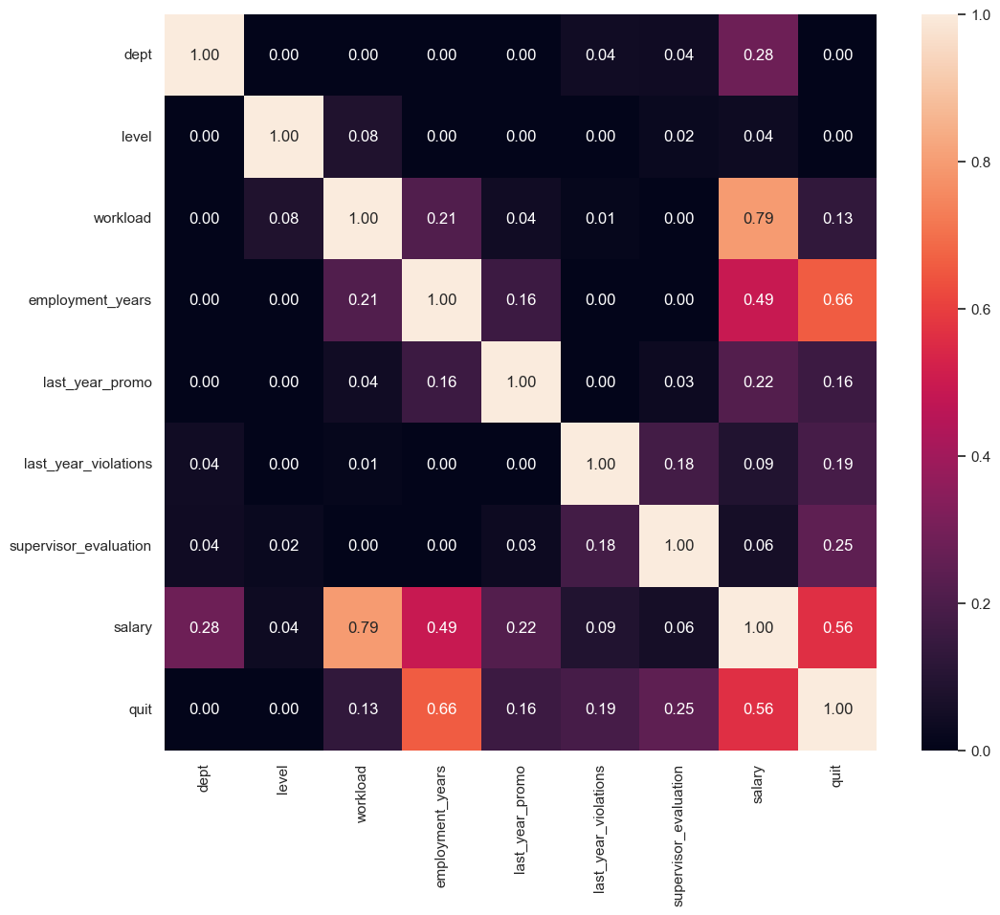

In [48]:
# Построение тепловой карты
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_train, annot=True, fmt='.2f') ;

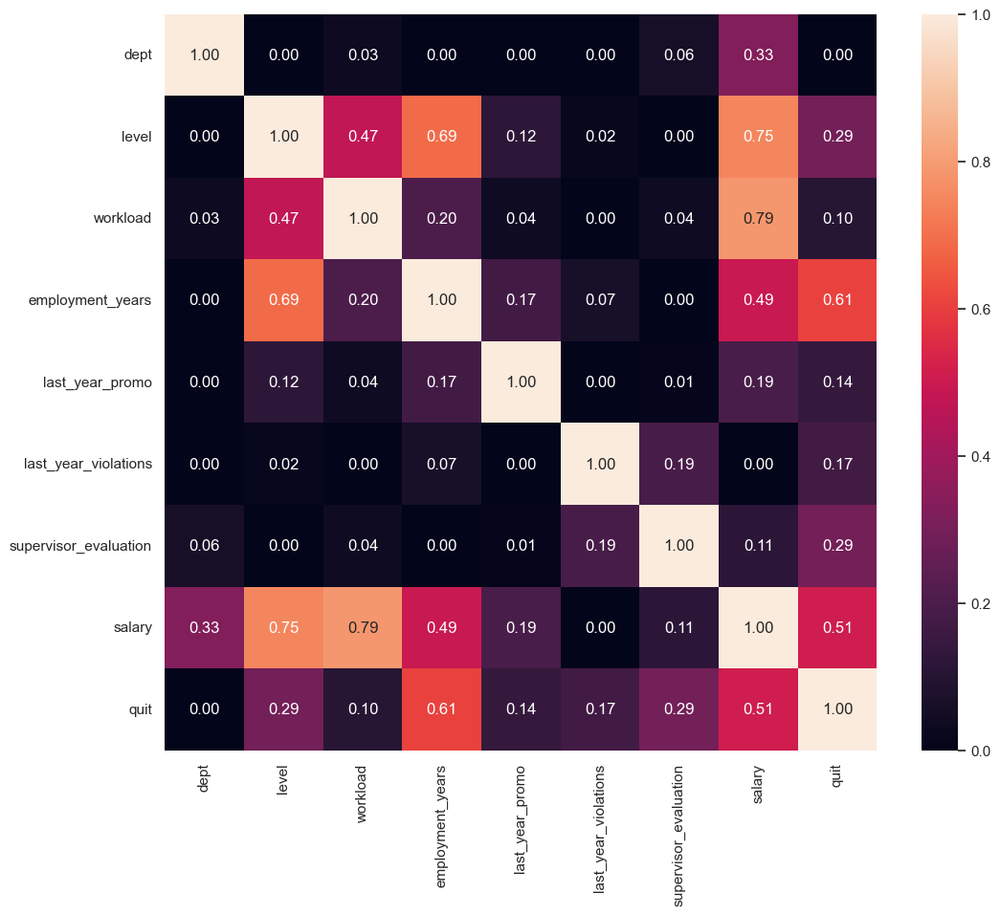

In [49]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_test, annot=True, fmt='.2f');

В данных нет существенных различий в части распределений признаков.
Мы наблюдаем среднюю прямую связь между целевым признаком и `level, employment_years, salary `, а также слабую прямую связь между целевым и `last_year_promo, last_year_violations, supervisor_evaluation`, связь между целевым и `dept` отсутствует.

**Мультиколлинеарность** между входными признаками **не наблюдается** коэффициент корреляции от 0.9 до 0.95 по модулю отсутствует. 

#### **Составим портрет «уволившегося сотрудника»**

In [50]:
# Отберем уволившихся и оставшихся сотрудников
quitted = train_quit.query('quit == "yes"')
stayed = train_quit.query('quit == "no"')

In [51]:
# Создаем функцию, которая визуализирует распределения категориальных признаков с использованием относительных величин
def cat_plot_norm(df):
    for col in df.select_dtypes(include=['object']).columns:
        plt.figure(figsize=(16,7))
        value_props = df[col].value_counts(normalize=True, dropna=False).sort_values(ascending=False)
        sns.barplot(x=value_props.index, y=value_props.values)
        plt.grid(True, linestyle='--', color='green', alpha=0.2, which='minor')
        plt.minorticks_on()
        plt.tick_params(which='minor')
        plt.xticks(rotation = 25)
        plt.title(f'Признак {col}')
        plt.xlabel(col)
        plt.ylabel('Доля')
        plt.show()

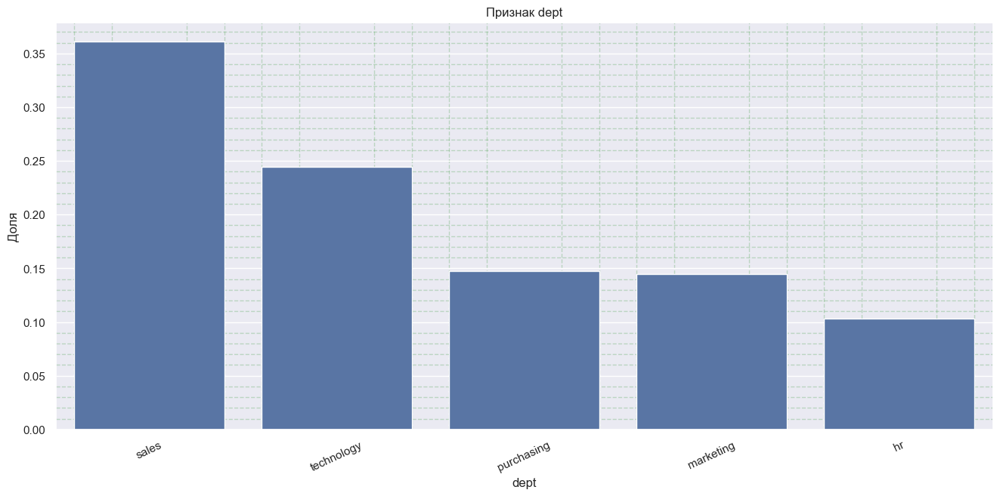

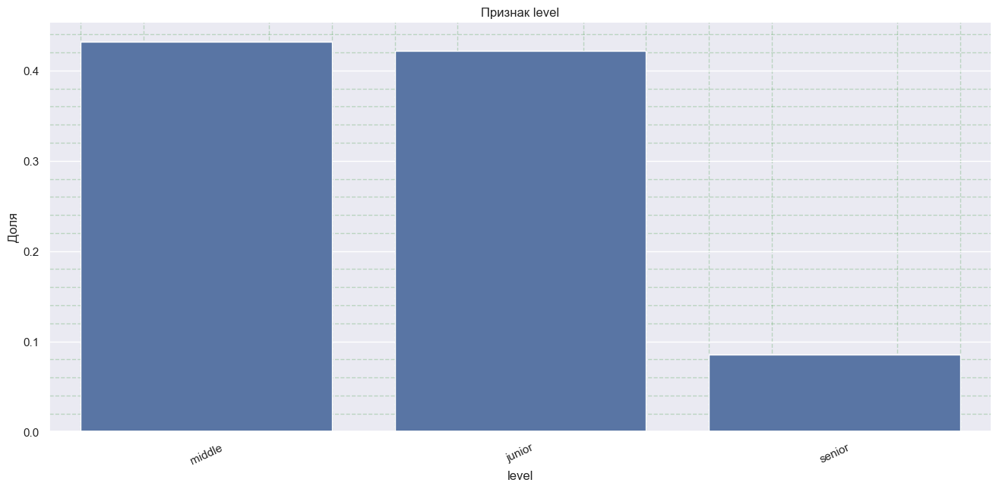

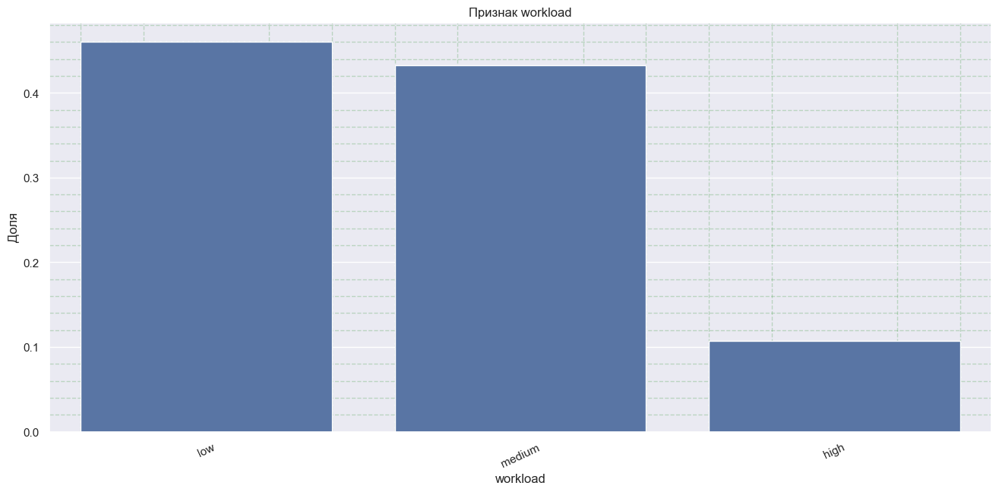

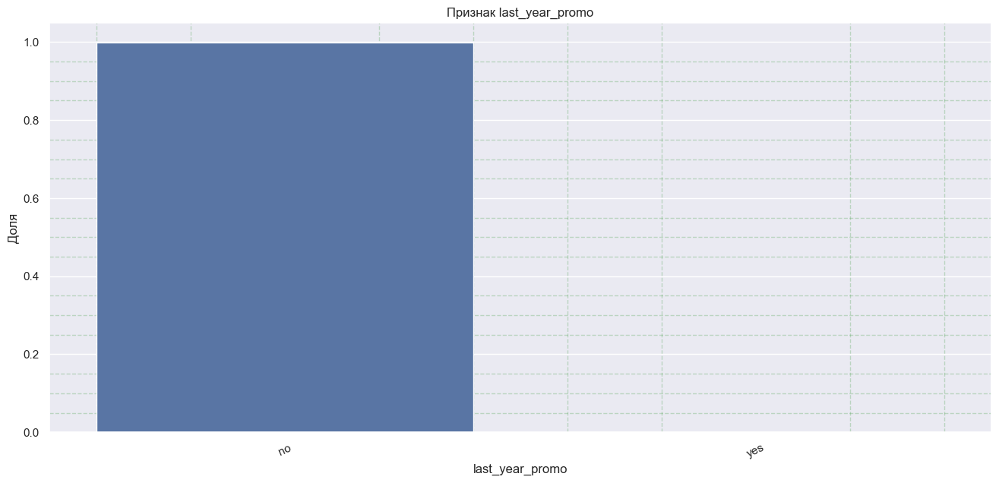

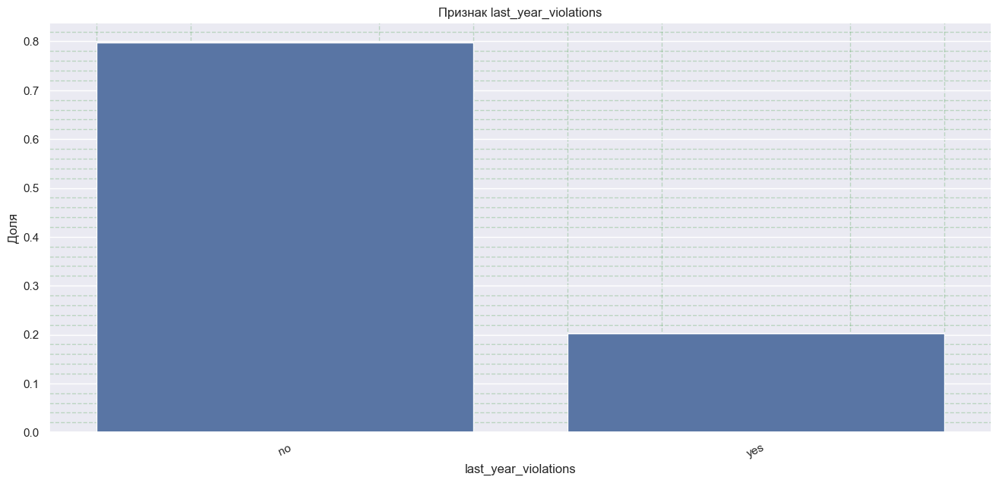

,employment_years,supervisor_evaluation,salary
count,1128.000000,1128.000000,1128.000000
mean,1.844858,3.046099,23885.106383
std,1.274920,0.973291,9351.599505
min,1.000000,1.000000,12000.000000
25%,1.000000,3.000000,16800.000000
50%,1.000000,3.000000,22800.000000
75%,2.000000,4.000000,27600.000000
max,10.000000,5.000000,79200.000000


In [52]:
cat_plot_norm(quitted.drop('quit',axis=1))
display(quitted.drop('id',axis=1).describe())

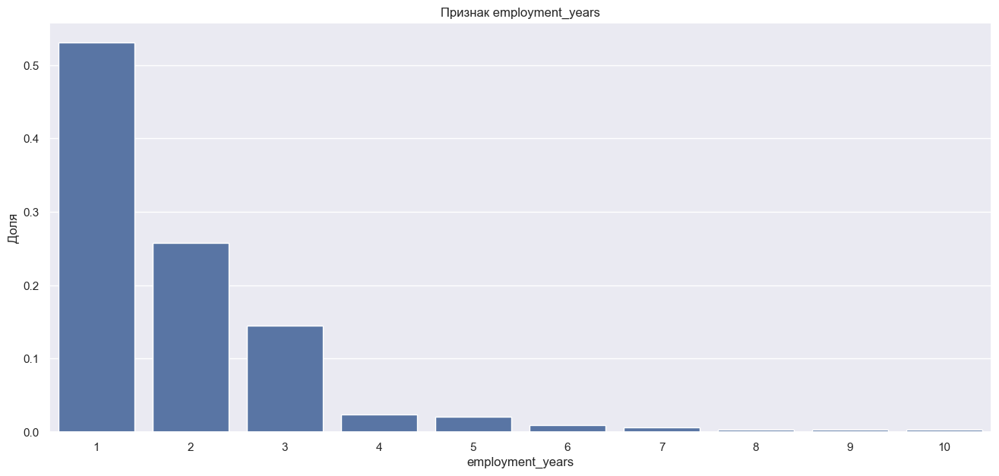

In [53]:
plt.figure(figsize=(16,7))
value_props = quitted['employment_years'].value_counts(normalize=True, dropna=False).sort_values(ascending=False)
sns.barplot(x=value_props.index, y=value_props.values)
plt.title(f'Признак employment_years')
plt.xlabel('employment_years')
plt.ylabel('Доля');

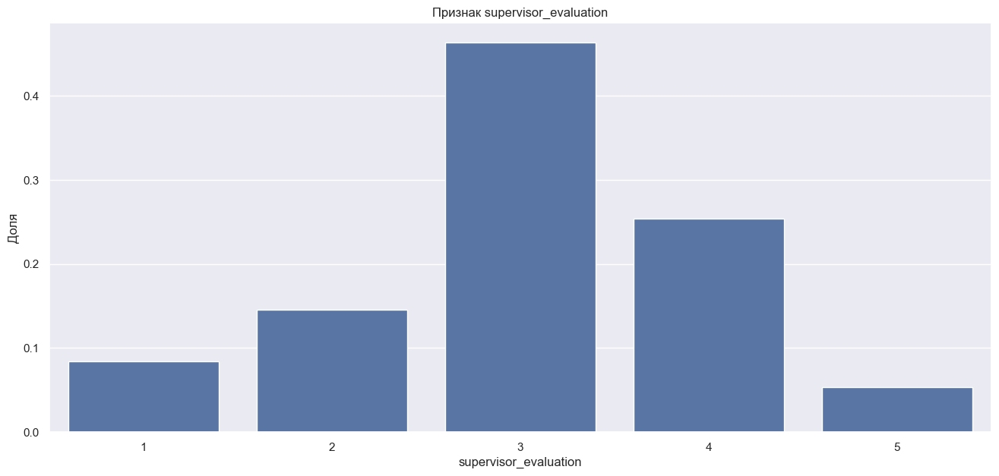

In [54]:
plt.figure(figsize=(16,7))
value_props = quitted['supervisor_evaluation'].value_counts(normalize=True, dropna=False).sort_values(ascending=False)
sns.barplot(x=value_props.index, y=value_props.values)
plt.title(f'Признак supervisor_evaluation')
plt.xlabel('supervisor_evaluation')
plt.ylabel('Доля');

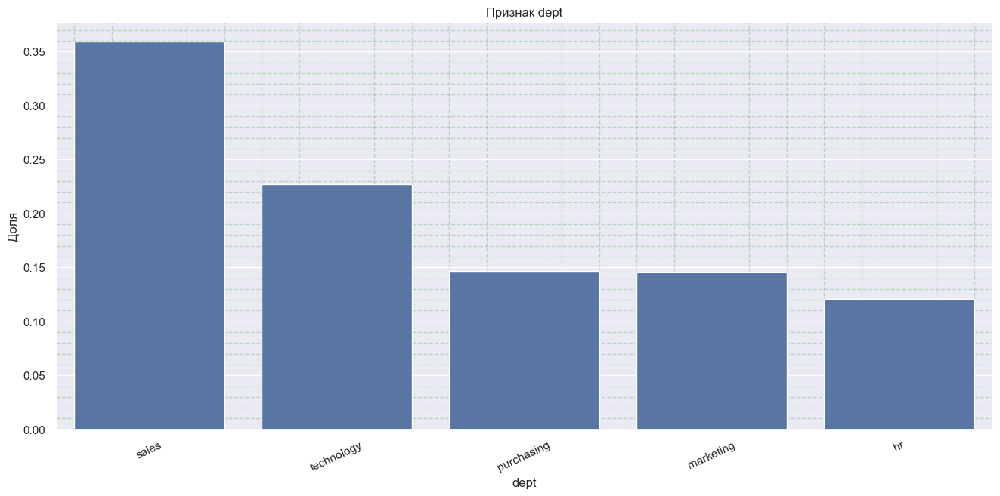

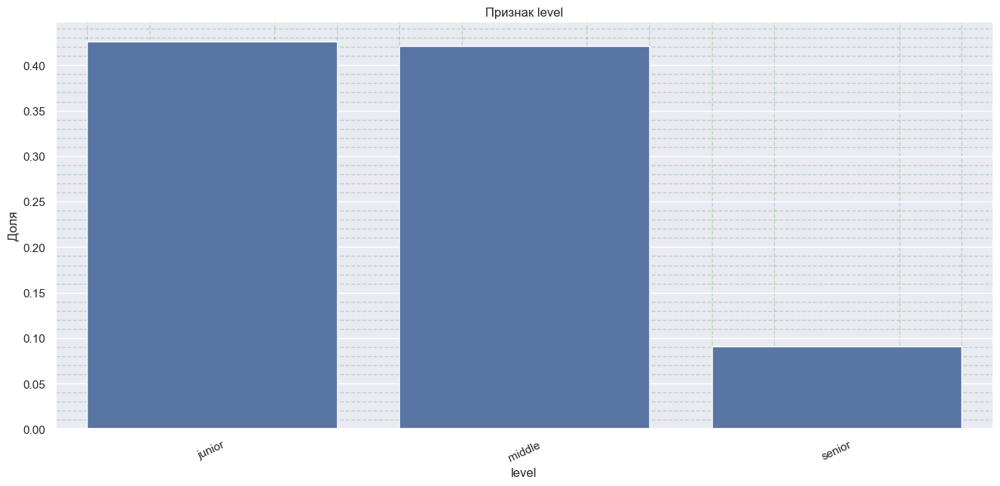

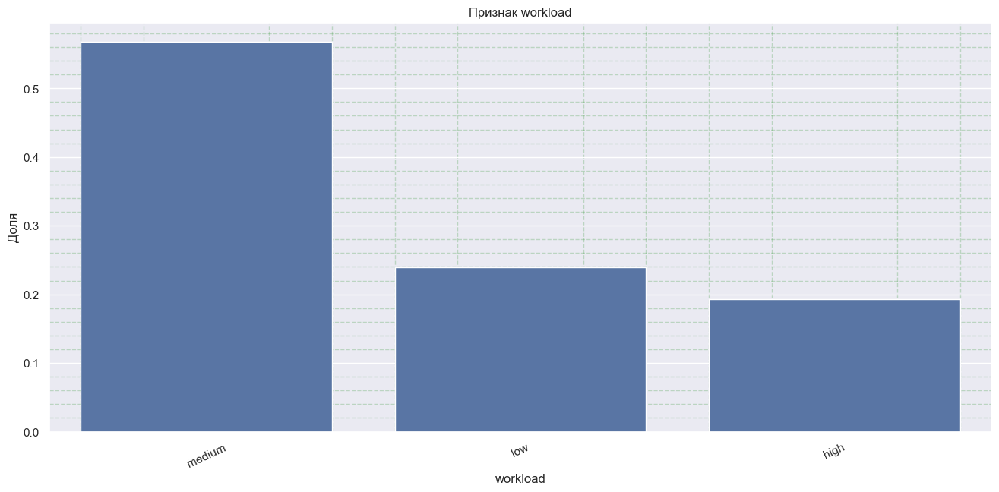

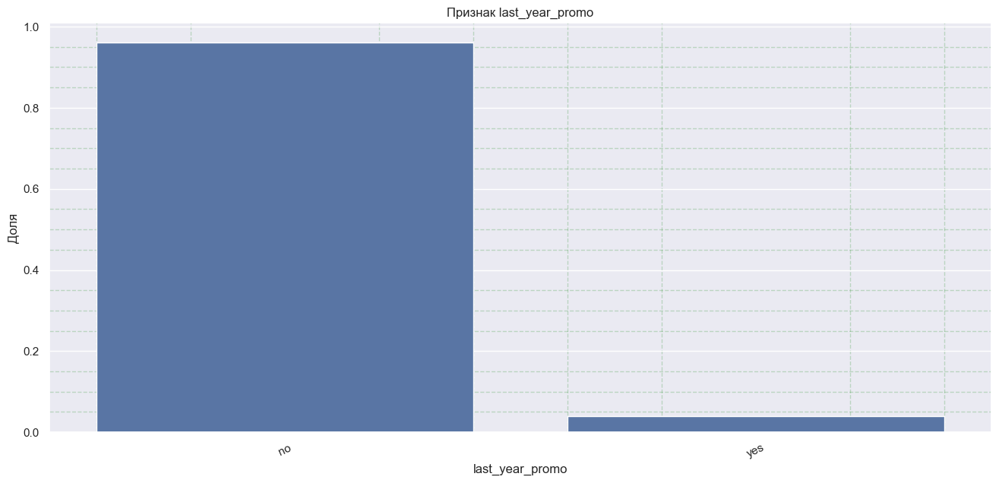

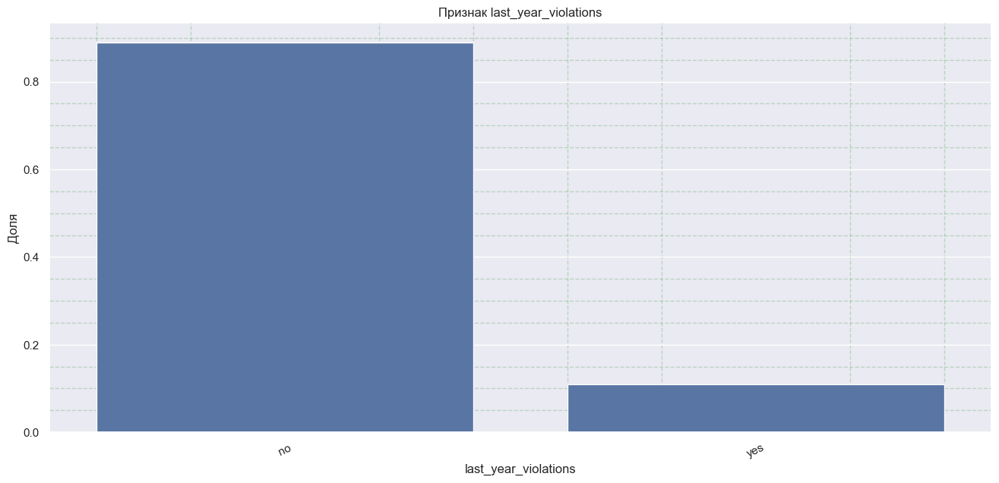

,employment_years,supervisor_evaluation,salary
count,2872.000000,2872.000000,2872.000000
mean,4.430710,3.643106,37702.228412
std,2.544635,0.965295,15218.977339
min,1.000000,1.000000,12000.000000
25%,2.000000,3.000000,25200.000000
50%,4.000000,4.000000,34800.000000
75%,6.000000,4.000000,46800.000000
max,10.000000,5.000000,96000.000000


In [55]:
cat_plot_norm(stayed.drop('quit',axis=1))
display(stayed.drop(['id','quit'],axis=1).describe())

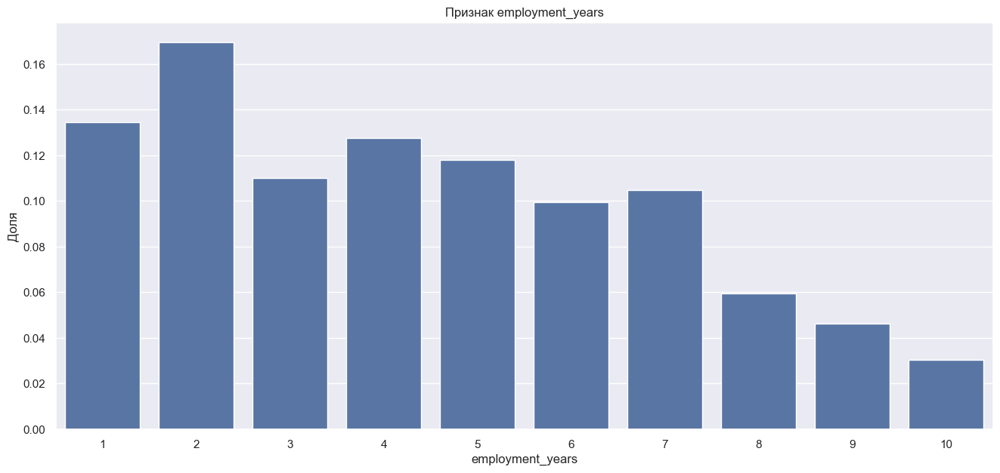

In [56]:
plt.figure(figsize=(16,7))
value_props = stayed['employment_years'].value_counts(normalize=True, dropna=False).sort_values(ascending=False)
sns.barplot(x=value_props.index, y=value_props.values)
plt.title(f'Признак employment_years')
plt.xlabel('employment_years')
plt.ylabel('Доля');

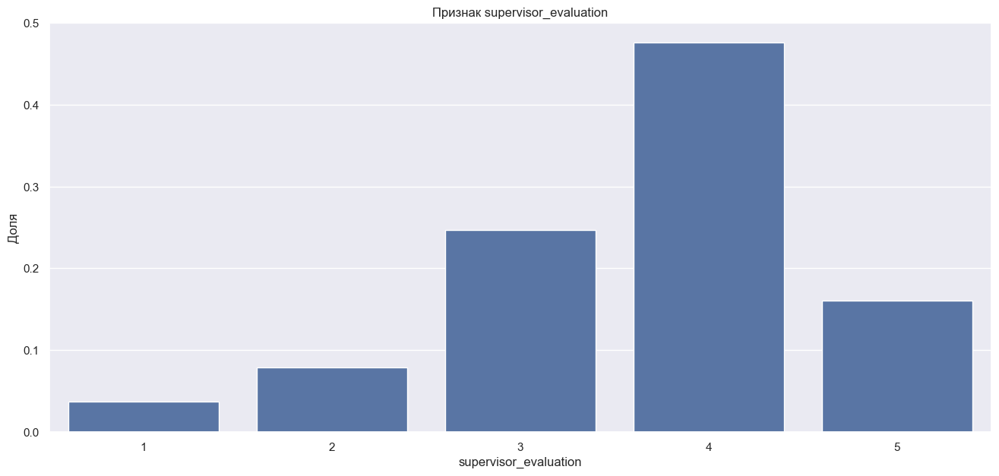

In [57]:
plt.figure(figsize=(16,7))
value_props = stayed['supervisor_evaluation'].value_counts(normalize=True, dropna=False).sort_values(ascending=False)
sns.barplot(x=value_props.index, y=value_props.values)
plt.title(f'Признак supervisor_evaluation')
plt.xlabel('supervisor_evaluation')
plt.ylabel('Доля');

**Вывод:** С большей вероятностью уволившийся сотрудник:

 -  будет работать в отделе продаж, что связано с многочисленностью данного отдела - там больше всего как уволившихся, так и оставшихся сотрудников;
 
 - имеет уровень - junior или middle, как и оставшиееся большинство;
 
 - низкую загруженность, увольнение могло быть связано со скукой;
 
 - не имел ни повышений, ни нарушений трудового договора. Но и оставшийся сотрудник в большинстве не имеет ни того, ни другого. Значит, эти факторы не повлияли на увольнение;
 
 - работал 1 год, прежде, чем уволиться, оставшиеся сотрудники в большинстве работают 2 года, что связано с комфортом нахождения в компании;
 
 - имеет оценку 3 качества работы сотрудника, которую дал руководитель, по сравнению с оставшимся оценка - 4, уход может быть связан с качеством работы;
 
 - имеет среднюю зп 23885 - гораздо ниже, чем у оставшихся со средней 37702. Это может быть связано с большим количеством ушедших junior сотрудников, чья средняя зп близка к общей средней зп уволившихся.

#### **Влияние уровня удовлетворенности на уход сторудника**

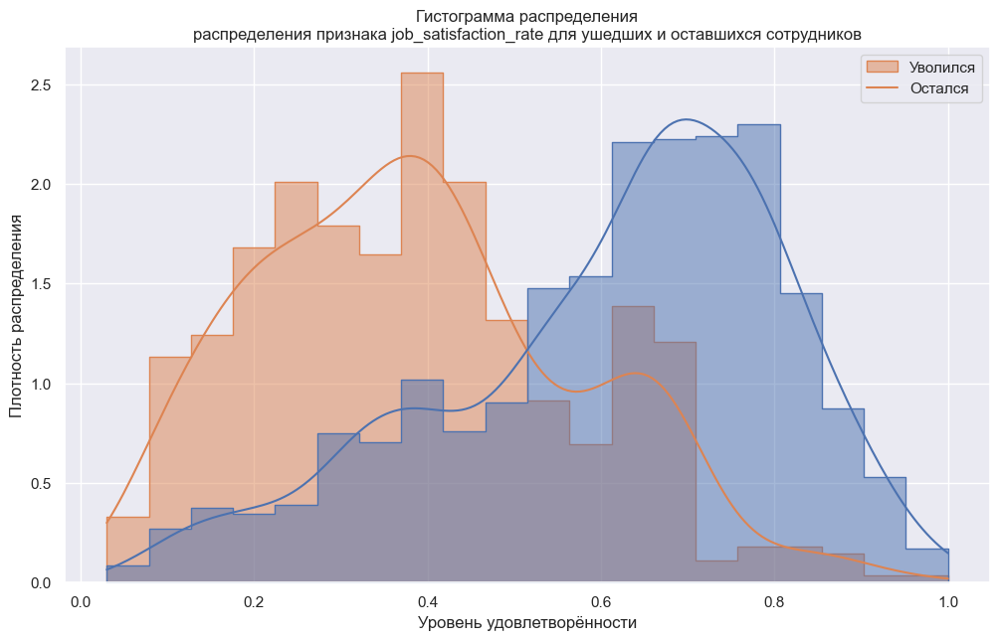

In [58]:
# Построим распределение признака job_satisfaction_rate для ушедших и оставшихся сотрудников.
plt.figure(figsize=(12, 7))
sns.histplot(data=target_satisfaction.merge(target_quit, on='id'), x='job_satisfaction_rate', hue='quit',
             kde=True, bins=20, alpha=0.5, element="step", stat='density', common_norm=False)
plt.title('Гистограмма распределения\nраспределения признака job_satisfaction_rate для ушедших и оставшихся сотрудников')
plt.xlabel('Уровень удовлетворённости')
plt.ylabel('Плотность распределения')
plt.legend(['Уволился', 'Остался'])


plt.show()

Проведем статистический тест для сравнения распределений в выборках.

H<sub>0</sub>: Уровень удовлетворенности уволившихся и оставшихся сотрудников в среднем одинаков

H<sub>1</sub>: Уровень удовлетворенности уволившихся сотрудников в среднем меньше, чем у оставшихся

In [59]:
data=target_satisfaction.merge(target_quit, on='id')
stayed = data.query('quit == "no"')
quitted = data.query('quit == "yes"')
# задаём уровень значимости
alpha = 0.05
# проводим ttest для двух выборок, в качестве альтернативной используем одностороннюю гипотезу «больше»
results = st.ttest_ind(quitted['job_satisfaction_rate'], stayed['job_satisfaction_rate'], alternative='less')
print(f'p-значение:{results.pvalue:.4f}')
# проверяем p-value
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу: уровень удовлетворенности уволившихся сотрудников в среднем меньше, чем у оставшихся')
else:
    print('Нет оснований отвергнуть нулевую гипотезу')

p-значение:0.0000
Отвергаем нулевую гипотезу: уровень удовлетворенности уволившихся сотрудников в среднем меньше, чем у оставшихся


**Вывод:** Есть основания говорить, что уровень удовлетворенности уволившихся сотрудников в среднем меньше, чем у оставшихся. Он **влияет** на то, уволится ли сотрудник. В большинстве уровень удовлетворенности ушедшего сотрудника от 0 до 0.6, в то время как у оставшегося от 0 до 1. То есть, на увольнение этот признак влияет, а на оставшихся нет.

**Общий вывод:** таким образом, мы провели статистический анализ количественных и категориальных признаков, корреляционный анализ и составили портрет уволившегося сотрудника. Аномальные значения не обнаружены, тестовая и тренировочная выборка серьезных различий не имеют, мультиколлинеарность между входными признаками отсутствует, связь между целевым и входными признаками изучена. Уровень удовлетворенности влияет на то, уволится ли сотрудник.

### **Подготовка данных**
<a id='pipeline1'></a>

Добавим `job_satisfaction_rate`, предсказанный лучшей моделью первой задачи, к входным признакам второй задачи.

In [60]:
y_train_pred = randomized_search.best_estimator_.predict(train_quit.drop('quit', axis=1))

In [61]:
test_features['job_satisfaction_rate'] = y_test_pred
train_quit['job_satisfaction_rate'] = y_train_pred

In [62]:
# Сохраняем  id работников из тестовых данных
test_ids = test_features['id']

In [63]:
train_quit = train_quit.drop('id', axis=1)
# Проверка наличия явных дубликатов
train_quit.duplicated().sum()

816

In [64]:
# Удаление явных дубликатов
train_quit = train_quit.drop_duplicates().reset_index(drop=True)

Проведем корреляционный анализ после добавления нового признака

In [65]:
# Вычисление матрицы корреляции 
correlation_train= train_quit.phik_matrix(interval_cols=['salary', 'job_satisfaction_rate'])
correlation_test = test_features.merge(target_quit,on='id').drop('id', axis=1).phik_matrix(interval_cols=['salary'])

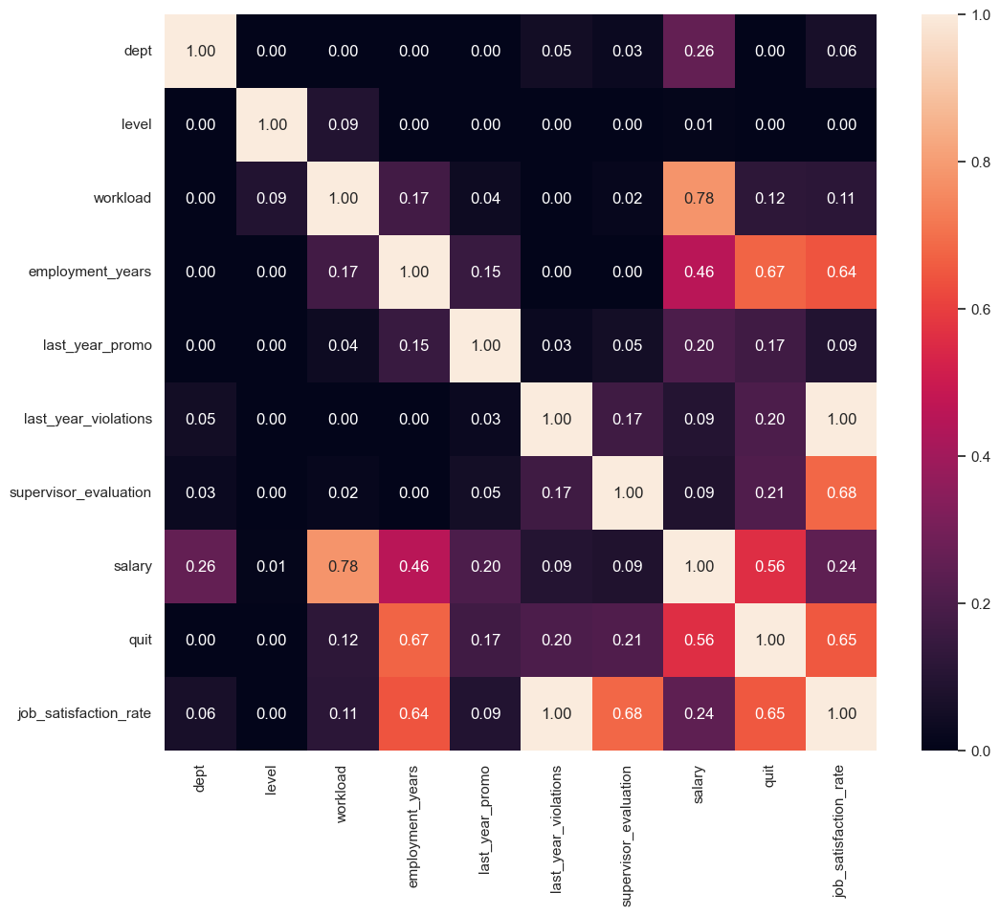

In [66]:
# Построение тепловой карты
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_train, annot=True, fmt='.2f');

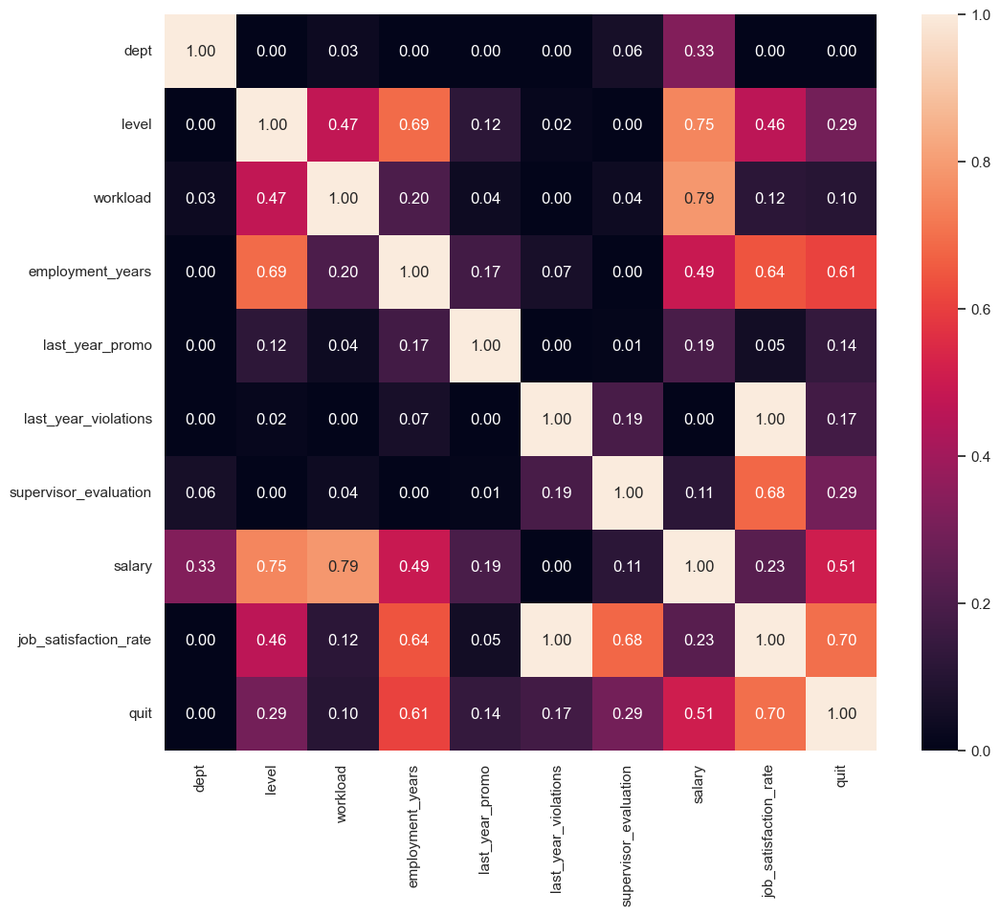

In [67]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_test, annot=True, fmt='.2f');

**Мультиколлинеарность** отсутствует, распределение тренировочной и тестовой выборки не имеют существенных различий.

Разобьем тренировочные и тестовые данные на входные и целевой признаки.

In [68]:
X_train, y_train = train_quit.drop('quit', axis=1), train_quit['quit']
X_test, y_test = test_features.drop('id', axis=1), target_quit.drop('id', axis=1)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3184, 9), (3184,), (2000, 9), (2000, 1))

Выполним кодирование целевого признака.

In [69]:
label_encoder = LabelEncoder()
label_encoder.fit(y_train)
label_encoder.classes_ = np.array(['no', 'yes'])
y_train = label_encoder.transform(y_train.values.ravel())
y_test = label_encoder.transform(y_test.values.ravel())

Подготовим данные, количественные и категориальные признаки обработаем в пайплайне.

In [70]:
# Создаём списки с названиями признаков
ohe_columns = ['dept', 'last_year_promo', 'last_year_violations']
ord_columns = ['level', 'workload']
num_columns = ['salary','employment_years', 'supervisor_evaluation', 'job_satisfaction_rate']

# Кодируем категориальные значения
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe', 
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore')
        )
    ]
)

ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder( 
         categories=[['junior', 'middle', 'senior'],
                    ['low', 'medium', 'high']], 
         handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

# Создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', MinMaxScaler(), num_columns),
    ], 
    remainder='passthrough'
)


# Создаём итоговый пайплайн: подготовка данных и модель
pipe_final= Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('feature_selection', SelectKBest(mutual_info_classif, k=10)),
        ('models', LinearRegression())
    ]
)


**Вывод:** таким образом, мы добавили новый признак и подготовили данные для дальнейшего обучения на них моделей.

### **Обучение моделей**
<a id='model2'></a>

Создадим словарь для подбора лучших гиперпараметров моделей.

In [73]:
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE,class_weight='balanced')],
        'models__max_depth': range(2,12),
        'models__min_samples_split':[2, 0.1, 0.5, 1.0, 5, 10],
        'models__min_samples_leaf':range(1,5),
        'models__max_features': range(2,7),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'],
        'feature_selection__k': [2, 4, 8]
    },
    
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(3, 12),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'],
        'feature_selection__k': [2, 4, 8]
    },
    
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            class_weight='balanced')],
        'models__C': np.logspace(-3, 3, 7),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(),RobustScaler(), 'passthrough'],
        'feature_selection__k': [2, 4, 8],
        'feature_selection__score_func': [ f_classif, mutual_info_classif]
    }
    
]

Используем один общий пайплайн для всех моделей и инструмент подбора гиперпараметров, который вернёт нам лучшую модель.

В качестве метрики возьмем ROC-AUC, так как имеем дело с бинарной классификацией. 

In [74]:
# Производим подбор гиперпараметров с помощью RandomizedSearchCV
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='roc_auc',
    random_state=RANDOM_STATE,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train)


print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_[0],'\n',
      randomized_search.best_estimator_[1], '\n',randomized_search.best_estimator_[2], '\n')
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)
dummy_regr = DummyClassifier()
dummy_regr.fit(X_train, y_train)
y_dummy_pred = dummy_regr.predict_proba(X_test)[:,1]
print('Метрика константной модели на тестовой выборке:', roc_auc_score(y_test, y_dummy_pred))

Лучшая модель и её параметры:

 ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'))]),
                                 ['dept', 'last_year_promo',
                                  'last_year_violations']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['junior',
                  

In [75]:
y_test_pred = randomized_search.predict_proba(X_test)[:,1]
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test, y_test_pred)}')

Метрика ROC-AUC на тестовой выборке: 0.4958266658764495


In [76]:
# Убедимся, что для test предсказания и ответы сравниваются для одного и того же работника.
# Создаем DataFrame для сравнения
results = pd.DataFrame({
    'id': test_ids,
    'real_class': y_test, 
    'predicted_class': y_test_pred
})
results.head(10)

,id,real_class,predicted_class
0,485046,1,0.305052
1,686555,0,0.526816
2,467458,0,0.186945
3,418655,0,0.200532
4,789145,1,0.068820
5,429973,0,0.068820
6,850699,0,0.868800
7,500791,0,0.000000
8,767867,0,0.089702
9,937235,0,0.959105


Строка с id=429973: реальный класс = 0, предсказанная вероятность = 0.068820.

Строка с id=789145: реальный = 1, предсказанный = 0.068820.

Это значит, что предсказания **не** привязаны к правильным работникам.

In [77]:
# Пересортируем данные
results_correct = pd.merge(
    test_features[['id']],
    pd.DataFrame({'id': test_ids, 'predicted_rate': y_test_pred}),
    on='id',
    how='left'
)
results_correct = pd.merge(
    results_correct,
    target_quit[['id', 'quit']],
    on='id',
    how='left'
)


In [78]:
print('Метрика константной модели на тестовой выборке:', roc_auc_score(y_test, y_dummy_pred))
print('Метрика ROC-AUC на тестовой выборке:',roc_auc_score(results_correct['quit'], y_test_pred))

Метрика константной модели на тестовой выборке: 0.5
Метрика ROC-AUC на тестовой выборке: 0.9053332246784804


**Вывод:** лучшая модель имеет следующие параметры: 

**DecisionTreeClassifier**(class_weight='balanced', max_depth=7, max_features=2,
                       min_samples_leaf=3, min_samples_split=10,
                       random_state=42) ,

метрика ROC-AUC на тестовой выборке: 0.91, а на кросс-валидации составляет 0.90 - результат не дотягивает до успешного.

Дерево решений выиграло в данной ситуации из-за гибких параметров и малого числа признаков

### **Итоговые выводы**
<a id='final'></a>

Таким образом мы создали модели машинного обучения для HR-аналитиков компании «Работа с заботой» и выполнили следующие цели:

1. Построили модель, которая сможет предсказать уровень удовлетворённости сотрудника на основе данных заказчика;

2. Построили модель, которая сможет на основе данных заказчика предсказать то, что сотрудник уволится из компании.


Для этого были выполнены следующие действия:

- **Открыты файлы** с данными и изучена общая информация: 

**`train_job_satisfaction_rate.csv`** содержал **4000 строк и 10 столбцов**.

**`test_features.csv`** содержал **2000 строк и 9 столбцов**.

**`test_target_job_satisfaction_rate.csv`** содержал **2000 строк и 2 столбца**.

**`train_quit.csv`** содержал **4000 строк и 10 столбцов**.

**`test_target_quit.csv`** содержал **2000 строк и 2 столбца**.

В данных присутствовали пропуски (заполнили их в пайплайне), типы данных корректны.



- Выполнена **предобработка данных:**
    
    изучили неявные и явные дубликаты и устранили.


- Провели **исследовательский анализ данных:**

  проверили аномальные значения и посмотрели на распределение количественных признаков;
  
  проанализировали категориальные признаки;
  
  провели корреляционный анализ;
  
  составили портрет "уволившегося сотрудника".
  

- Построили лучшую модель для 1 задачи:

    использовали один общий пайплайн для всех моделей и инструмент подбора гиперпараметров RandomizedSearchCV, который вернул нам лучшую модель со следующими характеристиками: 
    
    **DecisionTreeRegressor**(max_depth=3, max_features=2, min_samples_split=0.1,
                      random_state=42),

    метрика SMAPE на тестовой выборке: 10.6, а на тренировочной составляет 11.4 - результат дотягивает до успешного.
    
- Построили лучшую модель для 2 задачи:
    
     использовали один общий пайплайн для всех моделей и инструмент подбора гиперпараметров RandomizedSearchCV, который вернул нам лучшую модель со следующими характеристиками: 

    **DecisionTreeClassifier**(class_weight='balanced', max_depth=3, max_features=2,
                       min_samples_leaf=2, random_state=42),

    метрика ROC-AUC на тестовой выборке: 0.48, а на тренировочной составляет 0.88 - наблюдаем переобучение, результат не дотягивает до успешного.
    
**Рекомендации для бизнеса:** 

- Обратить внимание на сотрудников уровня junior и определить, по каким еще критериям отличаются уволившиеся от тех, кто остался с учетом небольшой разницы в зп;

- Работать над нагрузкой работников, придумать систему занятости, в которой сотруднику с низкой нагрузкой даются доп возможности проявить себя и не скучать без дела.


